In [3]:
#importing libraries

import warnings
warnings.filterwarnings("ignore")
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec
import plotly.express as px
from pandas import plotting
import missingno as ms
from sklearn.impute import SimpleImputer
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from visualizer import Visualizer
from fancyimpute import KNN
from sklearn.preprocessing import OrdinalEncoder
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import StandardScaler
from itertools import product
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

In [4]:

plt.style.use("ggplot") #setting the plot style

In [5]:
df = pd.read_csv("C:/Users/kouti/OneDrive/Desktop/Dataset/Lead-Scoring/Lead Scoring.csv")

In [6]:
df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,...,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,...,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,...,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [7]:
df.shape

(9240, 37)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

1) Lead Number - A lead number assigned to each lead procured.
2) Lead Origin - The origin identifier with which the customer was identified to be a lead. Includes API, Landing Page Submission, etc.
3) Lead Source - The source of the lead. Includes Google, Organic Search, Olark Chat, etc.
4) Do Not Email -An indicator variable selected by the customer wherein they select whether of not they want to be emailed about the course or not.
5) Do Not Call - An indicator variable selected by the customer wherein they select whether of not they want to be called about the course or not.
6) Converted - The target variable. Indicates whether a lead has been successfully converted or not.
7) TotalVisits - The total number of visits made by the customer on the website.
8) Total Time Spent on Website - The total time spent by the customer on the website.
9) Page Views Per Visit - Average number of pages on the website viewed during the visits.
10) Last Activity - Last activity performed by the customer. Includes Email Opened, Olark Chat Conversation, etc.
11) Country - The country of the customer.
12) Specialization - The industry domain in which the customer worked before. Includes the level 'Select Specialization' which means the customer had not selected this option while filling the form.
13) How did you hear about X Education - The source from which the customer heard about X Education.
14) What is your current occupation - Indicates whether the customer is a student, umemployed or employed.
15) What matters most to you in choosing this course An option selected by the customer - indicating what is their main motto behind doing this course.
16) Search - Indicating whether the customer had seen the ad in any of the listed items.
17) Magazine
18) Newspaper Article
19) X Education Forums
20) Newspaper
21) Digital Advertisement
22) Through Recommendations - Indicates whether the customer came in through recommendations.
23) Receive More Updates About Our Courses - Indicates whether the customer chose to receive more updates about the courses.
24) Tags - Tags assigned to customers indicating the current status of the lead.
25) Lead Quality - Indicates the quality of lead based on the data and intuition the employee who has been assigned to the lead.
26) Update me on Supply Chain Content - Indicates whether the customer wants updates on the Supply Chain Content.
27) Get updates on DM Content - Indicates whether the customer wants updates on the DM Content.
28) Lead Profile - A lead level assigned to each customer based on their profile.
29) City - The city of the customer.
30) Asymmetric Activity Index - An index and score assigned to each customer based on their activity and their profile
31) Asymmetric Profile Index
32) Asymmetric Activity Score
33) Asymmetric Profile Score
34) I agree to pay the amount through cheque - Indicates whether the customer has agreed to pay the amount through cheque or not.
35) a free copy of Mastering The Interview - Indicates whether the customer wants a free copy of 'Mastering the Interview' or not.
36) Last Notable Activity - The last notable activity performed by the student.
37) Prospect ID - A unique ID with which the customer is identified.

In [9]:
df.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


In [10]:
df.isnull().sum().sort_values(ascending=False)

Lead Quality                                     4767
Asymmetrique Activity Index                      4218
Asymmetrique Profile Score                       4218
Asymmetrique Activity Score                      4218
Asymmetrique Profile Index                       4218
Tags                                             3353
Lead Profile                                     2709
What matters most to you in choosing a course    2709
What is your current occupation                  2690
Country                                          2461
How did you hear about X Education               2207
Specialization                                   1438
City                                             1420
Page Views Per Visit                              137
TotalVisits                                       137
Last Activity                                     103
Lead Source                                        36
Receive More Updates About Our Courses              0
I agree to pay the amount th

<Axes: title={'center': 'Null Values Plot'}>

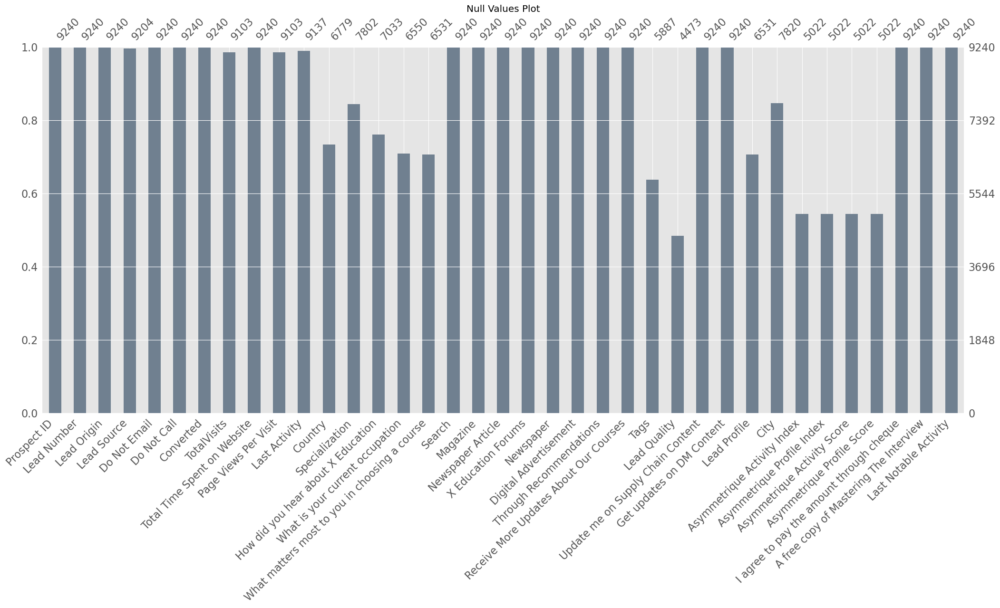

In [11]:
plt.title("Null Values Plot")
ms.bar(df, color = 'slategrey')

Series where the index represents the column names and the values represent the percentage of missing values in each column, sorted from highest to lowest percentage.

In [12]:
(df.isnull().sum()/df.shape[0]*100).sort_values(ascending = False)

Lead Quality                                     51.590909
Asymmetrique Activity Index                      45.649351
Asymmetrique Profile Score                       45.649351
Asymmetrique Activity Score                      45.649351
Asymmetrique Profile Index                       45.649351
Tags                                             36.287879
Lead Profile                                     29.318182
What matters most to you in choosing a course    29.318182
What is your current occupation                  29.112554
Country                                          26.634199
How did you hear about X Education               23.885281
Specialization                                   15.562771
City                                             15.367965
Page Views Per Visit                              1.482684
TotalVisits                                       1.482684
Last Activity                                     1.114719
Lead Source                                       0.3896

Seperated Numerical and Categorical Column

In [13]:
num_col = df.dtypes[(df.dtypes == 'int64') | (df.dtypes == 'float64')].keys()

In [14]:
cat_col = df.dtypes[~(df.dtypes == 'int64') & ~(df.dtypes == 'float64')].keys()

In [15]:
num_df = df[num_col]
cat_df = df[cat_col]

### Numerical Data Feature Enginnering

In [16]:
num_df

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
0,660737,0,0.0,0,0.00,15.0,15.0
1,660728,0,5.0,674,2.50,15.0,15.0
2,660727,1,2.0,1532,2.00,14.0,20.0
3,660719,0,1.0,305,1.00,13.0,17.0
4,660681,1,2.0,1428,1.00,15.0,18.0
...,...,...,...,...,...,...,...
9235,579564,1,8.0,1845,2.67,15.0,17.0
9236,579546,0,2.0,238,2.00,14.0,19.0
9237,579545,0,2.0,199,2.00,13.0,20.0
9238,579538,1,3.0,499,3.00,15.0,16.0


In [17]:
num_df.isnull().sum().sort_values(ascending = False)


Asymmetrique Activity Score    4218
Asymmetrique Profile Score     4218
TotalVisits                     137
Page Views Per Visit            137
Lead Number                       0
Converted                         0
Total Time Spent on Website       0
dtype: int64

In [18]:
(num_df.isnull().sum()/num_df.shape[0]*100).sort_values(ascending = False)

Asymmetrique Activity Score    45.649351
Asymmetrique Profile Score     45.649351
TotalVisits                     1.482684
Page Views Per Visit            1.482684
Lead Number                     0.000000
Converted                       0.000000
Total Time Spent on Website     0.000000
dtype: float64

Visualizing how the selected columns change over time, with missing values handled using forward fill or linear interpolation methods.

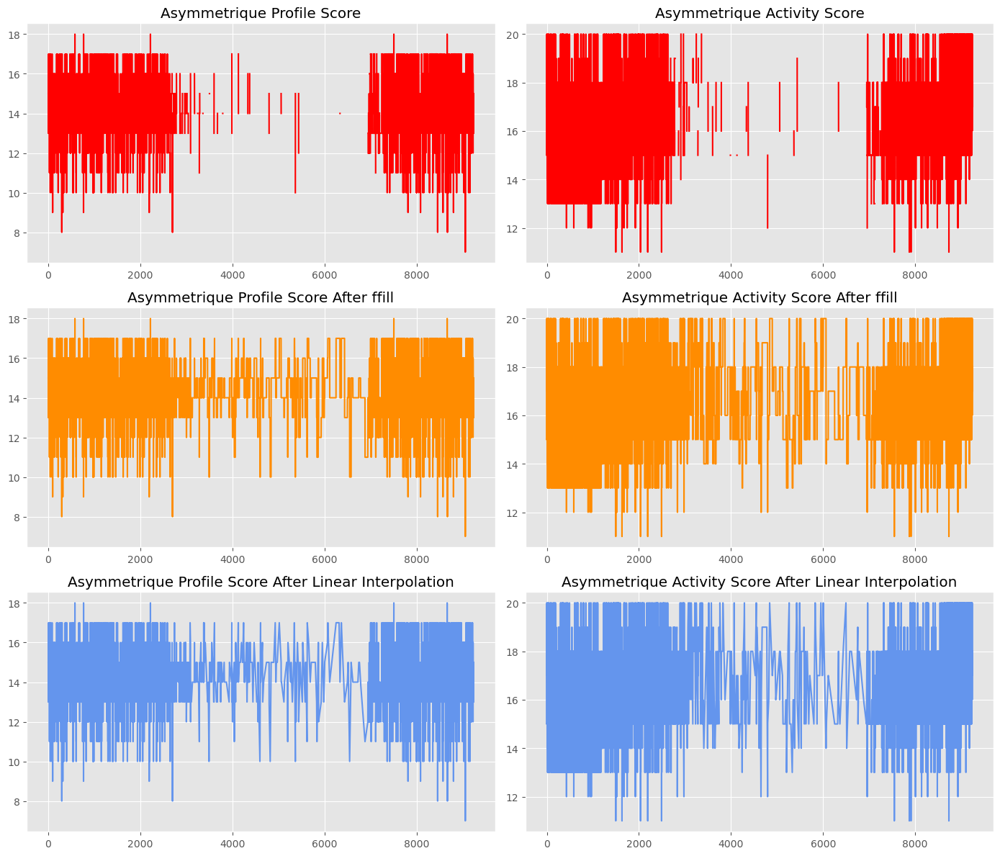

In [19]:
plt.figure(figsize=(14,12))
plt.subplot(321)
plt.title("Asymmetrique Profile Score")
plt.plot(num_df.iloc[:, 5], color = 'r')
plt.subplot(322)
plt.title("Asymmetrique Activity Score")
plt.plot(num_df.iloc[:, 6], color = 'r')
plt.subplot(323)
plt.title("Asymmetrique Profile Score After ffill")
plt.plot(num_df.iloc[:, 5].fillna(method = 'ffill'), color = 'darkorange')
plt.subplot(324)
plt.title("Asymmetrique Activity Score After ffill")
plt.plot(num_df.iloc[:, 6].fillna(method = 'ffill'), color = 'darkorange')
plt.subplot(325)
plt.title("Asymmetrique Profile Score After Linear Interpolation")
plt.plot(num_df.iloc[:, 5].interpolate(), color = 'cornflowerblue')
plt.subplot(326)
plt.title("Asymmetrique Activity Score After Linear Interpolation")
plt.plot(num_df.iloc[:, 6].interpolate(), color = 'cornflowerblue')
plt.tight_layout()

As we can see here there are lot of null values present so if we try to impute or interpolate the data will not be an ideal way in case if there are many null values available in your data. It's better to exclude that column to avoid randomness & bias in our model.

In [20]:
se_median = SimpleImputer(missing_values = np.nan, strategy='median')

In [21]:
num_df[['TotalVisits', 'Page Views Per Visit']] = se_median.fit_transform(num_df[['TotalVisits', 'Page Views Per Visit']])

Text(0.5, 1.0, 'Page Views Per Visit')

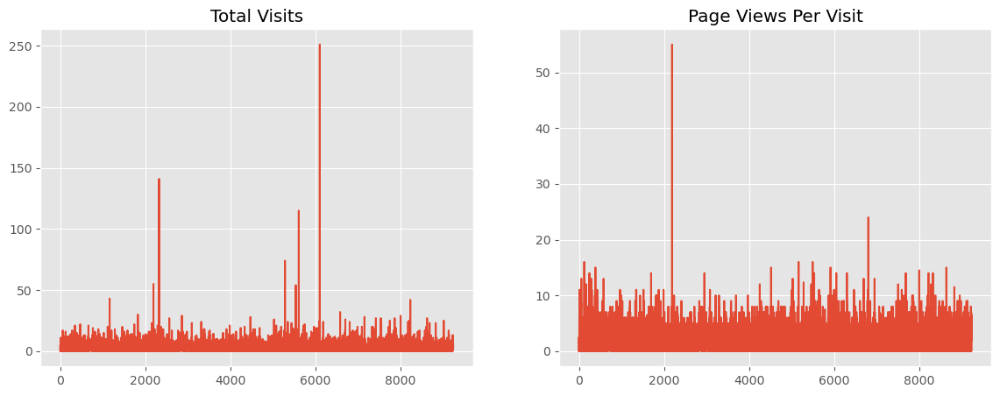

In [22]:
plt.figure(figsize=(14,5))
plt.subplot(121)
plt.plot(num_df['TotalVisits'])
plt.title("Total Visits")
plt.subplot(122)
plt.plot(num_df['Page Views Per Visit'])
plt.title("Page Views Per Visit")

In [23]:
num_df = num_df.drop(['Asymmetrique Activity Score', 'Asymmetrique Profile Score'], axis = 1)

In [24]:
#final data columns for numerical values which we are going to use for our analysis
num_df.isnull().sum()

Lead Number                    0
Converted                      0
TotalVisits                    0
Total Time Spent on Website    0
Page Views Per Visit           0
dtype: int64

### Categorical Data Feature Engineering + (Analysis)

In [25]:
cat_df

,Prospect ID,Lead Origin,Lead Source,Do Not Email,Do Not Call,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,...,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,API,Olark Chat,No,No,Page Visited on Website,NaN,Select,Select,Unemployed,...,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,API,Organic Search,No,No,Email Opened,India,Select,Select,Unemployed,...,NaN,No,No,Select,Select,02.Medium,02.Medium,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,Landing Page Submission,Direct Traffic,No,No,Email Opened,India,Business Administration,Select,Student,...,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,Landing Page Submission,Direct Traffic,No,No,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,...,Not Sure,No,No,Select,Mumbai,02.Medium,01.High,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,Landing Page Submission,Google,No,No,Converted to Lead,India,Select,Other,Unemployed,...,Might be,No,No,Select,Mumbai,02.Medium,01.High,No,No,Modified
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9235,19d6451e-fcd6-407c-b83b-48e1af805ea9,Landing Page Submission,Direct Traffic,Yes,No,Email Marked Spam,Saudi Arabia,IT Projects Management,Select,Unemployed,...,High in Relevance,No,No,Potential Lead,Mumbai,02.Medium,01.High,No,No,Email Marked Spam
9236,82a7005b-7196-4d56-95ce-a79f937a158d,Landing Page Submission,Direct Traffic,No,No,SMS Sent,India,Media and Advertising,Select,Unemployed,...,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,No,Yes,SMS Sent
9237,aac550fe-a586-452d-8d3c-f1b62c94e02c,Landing Page Submission,Direct Traffic,Yes,No,SMS Sent,India,Business Administration,Select,Unemployed,...,Not Sure,No,No,Potential Lead,Mumbai,02.Medium,01.High,No,Yes,SMS Sent
9238,5330a7d1-2f2b-4df4-85d6-64ca2f6b95b9,Landing Page Submission,Google,No,No,SMS Sent,India,Human Resource Management,Online Search,NaN,...,NaN,No,No,NaN,Other Metro Cities,02.Medium,02.Medium,No,No,SMS Sent


In [26]:
cat_df.isnull().sum().sort_values(ascending = False)

Lead Quality                                     4767
Asymmetrique Activity Index                      4218
Asymmetrique Profile Index                       4218
Tags                                             3353
Lead Profile                                     2709
What matters most to you in choosing a course    2709
What is your current occupation                  2690
Country                                          2461
How did you hear about X Education               2207
Specialization                                   1438
City                                             1420
Last Activity                                     103
Lead Source                                        36
I agree to pay the amount through cheque            0
A free copy of Mastering The Interview              0
Get updates on DM Content                           0
Update me on Supply Chain Content                   0
Prospect ID                                         0
Newspaper                   

In [27]:
(cat_df.isnull().sum()/cat_df.shape[0]*100).sort_values(ascending = False)

Lead Quality                                     51.590909
Asymmetrique Activity Index                      45.649351
Asymmetrique Profile Index                       45.649351
Tags                                             36.287879
Lead Profile                                     29.318182
What matters most to you in choosing a course    29.318182
What is your current occupation                  29.112554
Country                                          26.634199
How did you hear about X Education               23.885281
Specialization                                   15.562771
City                                             15.367965
Last Activity                                     1.114719
Lead Source                                       0.389610
I agree to pay the amount through cheque          0.000000
A free copy of Mastering The Interview            0.000000
Get updates on DM Content                         0.000000
Update me on Supply Chain Content                 0.0000

Seperating columns which has null values

In [28]:
cat_null_cols = (cat_df.isnull().sum()/cat_df.shape[0]*100).sort_values(ascending = False)[:13].keys()

In [29]:
#creating a function which will iterate each value and check for the data type and returning if there as any int ot float values present 

def check_str(data, col):
    
    for i in data[col]: 
        if isinstance(i, str):
            continue
        else:
            print("Alert: Float/Int Values Found in Categorical Column..!!!")
            break

In [30]:
check_str(cat_df[cat_null_cols], 'Lead Quality')

Alert: Float/Int Values Found in Categorical Column..!!!


In [31]:
check_str(cat_df[cat_null_cols].fillna(value = str(np.nan)), 'Lead Quality')

In [32]:
cat_df[cat_null_cols].isnull().sum()

Lead Quality                                     4767
Asymmetrique Activity Index                      4218
Asymmetrique Profile Index                       4218
Tags                                             3353
Lead Profile                                     2709
What matters most to you in choosing a course    2709
What is your current occupation                  2690
Country                                          2461
How did you hear about X Education               2207
Specialization                                   1438
City                                             1420
Last Activity                                     103
Lead Source                                        36
dtype: int64

In [33]:
new_cat_df = cat_df[cat_null_cols]

In [34]:
new_cat_df.isnull().sum()/new_cat_df.shape[0]*100

Lead Quality                                     51.590909
Asymmetrique Activity Index                      45.649351
Asymmetrique Profile Index                       45.649351
Tags                                             36.287879
Lead Profile                                     29.318182
What matters most to you in choosing a course    29.318182
What is your current occupation                  29.112554
Country                                          26.634199
How did you hear about X Education               23.885281
Specialization                                   15.562771
City                                             15.367965
Last Activity                                     1.114719
Lead Source                                       0.389610
dtype: float64

<Axes: title={'center': 'After Imputing with Most Frequent Value'}, xlabel='Lead Quality', ylabel='count'>

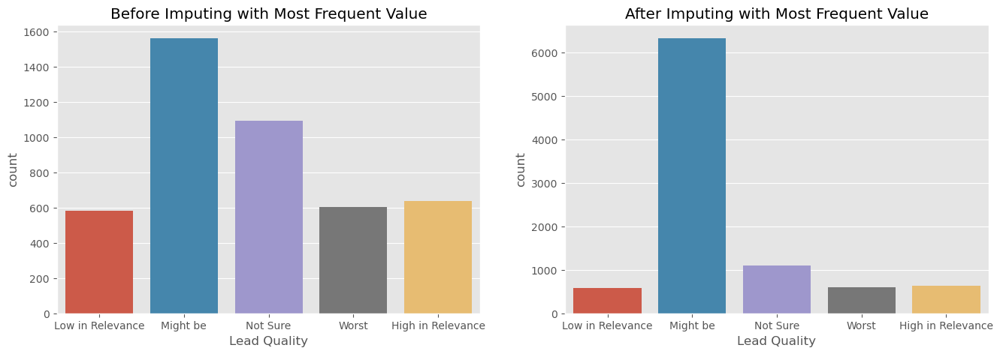

In [35]:
plt.figure(figsize=(16,5))
plt.subplot(121)
plt.title("Before Imputing with Most Frequent Value")
sns.countplot(data = new_cat_df, x = 'Lead Quality')
plt.subplot(122)
plt.title("After Imputing with Most Frequent Value")
sns.countplot(data = new_cat_df.fillna(value = new_cat_df['Lead Quality'].mode()[0]), x = 'Lead Quality')

As you can see in our 'Lead Quality' case if we try to impute 'NaN' values with most frequent value then it will going to create an imbalance class with our column data which we definitely not want so we have to find some other way to tackle this situation of missing values.

In [36]:
 new_cat_df.head()

,Lead Quality,Asymmetrique Activity Index,Asymmetrique Profile Index,Tags,Lead Profile,What matters most to you in choosing a course,What is your current occupation,Country,How did you hear about X Education,Specialization,City,Last Activity,Lead Source
0,Low in Relevance,02.Medium,02.Medium,Interested in other courses,Select,Better Career Prospects,Unemployed,NaN,Select,Select,Select,Page Visited on Website,Olark Chat
1,NaN,02.Medium,02.Medium,Ringing,Select,Better Career Prospects,Unemployed,India,Select,Select,Select,Email Opened,Organic Search
2,Might be,02.Medium,01.High,Will revert after reading the email,Potential Lead,Better Career Prospects,Student,India,Select,Business Administration,Mumbai,Email Opened,Direct Traffic
3,Not Sure,02.Medium,01.High,Ringing,Select,Better Career Prospects,Unemployed,India,Word Of Mouth,Media and Advertising,Mumbai,Unreachable,Direct Traffic
4,Might be,02.Medium,01.High,Will revert after reading the email,Select,Better Career Prospects,Unemployed,India,Other,Select,Mumbai,Converted to Lead,Google


Let's try to understand why there are Null Values Present into our data so based on that we will be able to identify which columns we can negate from our data and which columns we can keep for the imputation process.

In [37]:
new_cat_df.isnull().sum()

Lead Quality                                     4767
Asymmetrique Activity Index                      4218
Asymmetrique Profile Index                       4218
Tags                                             3353
Lead Profile                                     2709
What matters most to you in choosing a course    2709
What is your current occupation                  2690
Country                                          2461
How did you hear about X Education               2207
Specialization                                   1438
City                                             1420
Last Activity                                     103
Lead Source                                        36
dtype: int64

In [38]:
cat_df[(cat_df['Lead Source'].isnull())][['Lead Origin', 'Lead Source', 'Last Activity', 'City', 'Specialization', 'Country', 'Tags']]

,Lead Origin,Lead Source,Last Activity,City,Specialization,Country,Tags
836,Lead Add Form,NaN,Email Bounced,Select,Select,NaN,NaN
1569,Lead Add Form,NaN,SMS Sent,Select,Select,NaN,Will revert after reading the email
1746,Lead Add Form,NaN,SMS Sent,Select,Select,NaN,NaN
2020,Lead Add Form,NaN,SMS Sent,Select,Select,NaN,NaN
2025,Lead Add Form,NaN,SMS Sent,Select,Select,NaN,Will revert after reading the email
2152,Lead Add Form,NaN,SMS Sent,Select,Select,NaN,NaN
2346,Lead Add Form,NaN,SMS Sent,Select,Select,NaN,Will revert after reading the email
2544,Lead Import,NaN,Email Opened,Select,Select,NaN,number not provided
2601,Quick Add Form,NaN,Email Bounced,Other Metro Cities,E-COMMERCE,NaN,NaN
2676,Lead Add Form,NaN,SMS Sent,Other Cities of Maharashtra,Human Resource Management,NaN,Will revert after reading the email


So based on my understanding of the above table, I am able to conclude while inspecting the reason for Null Values in 'Lead Source' is that the form fields which are available to the users are not marked mandatory that's why they're coming as null.

The Lead Source which are coming as Null are those who came from the 'Lead Add Form', 'Quick Add Form' & 'Landing Page Submission'. Also, if we take a look at the associated 'Tags' those give us bit of an idea that the person might not be interested or busy to attend or revert to any communication.

In [39]:
asd = (cat_df[(cat_df['Last Activity'].isnull())][['Lead Origin','Lead Source','Last Activity','City','Specialization', 'Country', 'Tags']])

In [40]:
asd['Lead Source'].nunique()

3

In [41]:
# Assuming 'df' is your DataFrame and 'column_name' is the name of the column
unique_values = asd['Lead Source'].unique()
print(unique_values)


['Welingak Website' 'Reference' 'Facebook' nan]


Here what I can see is that the person who filled the form from either these three sources that is 'Welingak Website', 'Reference', 'Facebook' no activity has been registered for these users.

But Why......????

Maybe the person who are incharge can answer this question or maybe they are most likely to be converted also if we take a look at some of the tags cells, the lead from these sources are closed and maybe converted for the next lead stage.

In [42]:
(cat_df[(cat_df['Lead Quality'].isnull())][['Lead Quality', 'Lead Origin', 'Lead Source', 'Last Activity', 'City', 'Specialization', 'Country', 'Tags', 'Lead Profile']]).head(10)

,Lead Quality,Lead Origin,Lead Source,Last Activity,City,Specialization,Country,Tags,Lead Profile
1,NaN,API,Organic Search,Email Opened,Select,Select,India,Ringing,Select
5,NaN,API,Olark Chat,Olark Chat Conversation,NaN,NaN,NaN,NaN,NaN
7,NaN,API,Olark Chat,Olark Chat Conversation,NaN,NaN,NaN,NaN,NaN
8,NaN,Landing Page Submission,Direct Traffic,Email Opened,Thane & Outskirts,IT Projects Management,India,NaN,NaN
9,NaN,API,Google,Email Opened,Mumbai,Finance Management,India,NaN,NaN
11,NaN,Landing Page Submission,Direct Traffic,Page Visited on Website,Thane & Outskirts,Human Resource Management,India,Lost to EINS,Select
13,NaN,Landing Page Submission,Organic Search,Email Opened,Thane & Outskirts,Business Administration,India,Ringing,Select
14,NaN,Landing Page Submission,Direct Traffic,Email Bounced,Select,Business Administration,Russia,NaN,Select
16,NaN,API,Olark Chat,Olark Chat Conversation,NaN,NaN,NaN,NaN,NaN
18,NaN,Landing Page Submission,Google,Page Visited on Website,Mumbai,Marketing Management,India,NaN,Select


If we take a look at the 'Lead Quality' we can see lot of NaN values. The reason which I think is because of the other column information are not presented so that's why the CRM not able to judget or assign the "Lead Quality". Before going to any of the conclusion, let's first check the data where we don't have the null values.

In [43]:
(cat_df[(~cat_df['Lead Quality'].isnull())][['Lead Quality', 'Lead Origin', 'Lead Source', 'Last Activity', 'City', 'Specialization', 'Country', 'Tags', 'Lead Profile']]).head(10)

,Lead Quality,Lead Origin,Lead Source,Last Activity,City,Specialization,Country,Tags,Lead Profile
0,Low in Relevance,API,Olark Chat,Page Visited on Website,Select,Select,NaN,Interested in other courses,Select
2,Might be,Landing Page Submission,Direct Traffic,Email Opened,Mumbai,Business Administration,India,Will revert after reading the email,Potential Lead
3,Not Sure,Landing Page Submission,Direct Traffic,Unreachable,Mumbai,Media and Advertising,India,Ringing,Select
4,Might be,Landing Page Submission,Google,Converted to Lead,Mumbai,Select,India,Will revert after reading the email,Select
6,Low in Relevance,Landing Page Submission,Google,Email Opened,Mumbai,Supply Chain Management,India,Will revert after reading the email,Potential Lead
10,Might be,Landing Page Submission,Organic Search,Email Opened,Other Metro Cities,Travel and Tourism,India,Will revert after reading the email,Select
12,Might be,API,Organic Search,Email Opened,Select,Marketing Management,India,Will revert after reading the email,Potential Lead
15,Might be,API,Organic Search,Email Opened,Select,Select,India,Will revert after reading the email,Select
17,Might be,API,Referral Sites,Email Link Clicked,Select,Select,India,Interested in other courses,Select
19,Worst,API,Organic Search,Page Visited on Website,Select,Select,India,Interested in other courses,Select


As you can see here we have lot of information present in other columns so that's why the 'Lead Quality' has assigned to each prospect, this is what I think after inspecting the data.

Let's exclude those columns where we have Null Values more than 40% as imputing those values will not going to be good strategy but if we try to include those columns there may be a chance of bias & within class imbalance will gets added to our model so for now what we can do is to exclude those columns only and try to impute those columns where we have null values below the threshold which we are consider for selecting those columns for imputation.

In [44]:
temp_cat_df = new_cat_df.drop(["Lead Quality", "Asymmetrique Profile Index", "Asymmetrique Activity Index"], axis = 1)

In [45]:
(temp_cat_df.isnull().sum()/temp_cat_df.shape[0])

Tags                                             0.362879
Lead Profile                                     0.293182
What matters most to you in choosing a course    0.293182
What is your current occupation                  0.291126
Country                                          0.266342
How did you hear about X Education               0.238853
Specialization                                   0.155628
City                                             0.153680
Last Activity                                    0.011147
Lead Source                                      0.003896
dtype: float64

Plotting Tags : Tags assigned to customers indicating the current status of the lead.

In [46]:
px.histogram(data_frame = temp_cat_df, x = 'Tags', title = 'Lead Source Distribution')

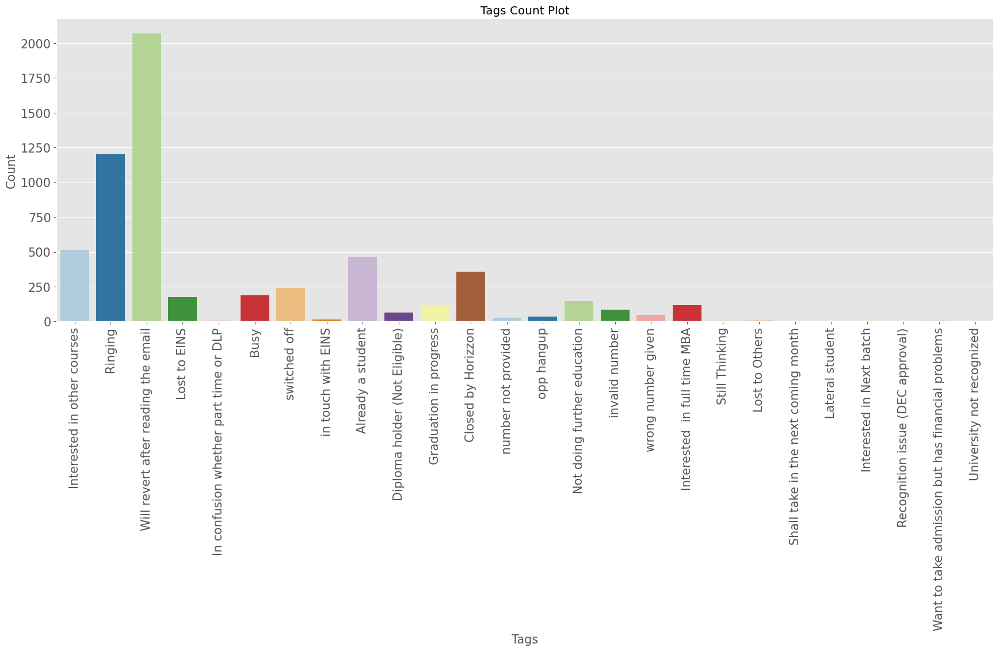

In [47]:
sns.catplot(data = temp_cat_df, x = 'Tags', kind = 'count', palette = 'Paired', aspect = 3, height=6).set(title = 'Tags Count Plot')
plt.xticks(rotation = 'vertical')
plt.tick_params(labelsize=15)
plt.xlabel("Tags", size = 15)
plt.ylabel("Count", size = 15)
plt.show()

If we take a look at the Null values that are present in the "Tags" column are 36% but apart from that we can see here is that most people have reply with "Will revert after reading the email" & few of them did not picked up the call and their call went unanswered.

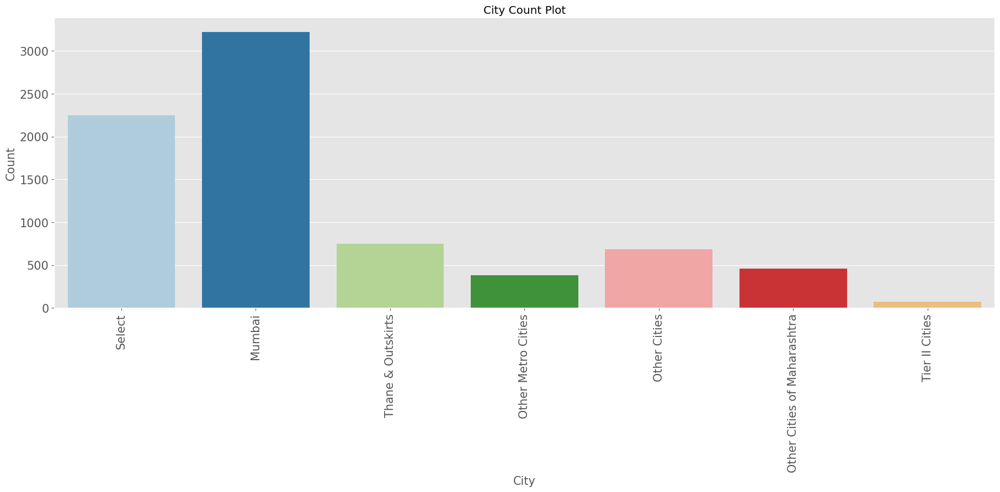

In [48]:
sns.catplot(data = temp_cat_df, x = 'City', kind = 'count', palette = 'Paired', aspect = 3, height=6).set(title = 'City Count Plot')
plt.xticks(rotation = 'vertical')
plt.tick_params(labelsize=15)
plt.xlabel("City", size = 15)
plt.ylabel("Count", size = 15)
plt.show()

We have close to ~15% Null values in our city columns but most of the users who have filled the lead form are from "Mumbai" but most people have not selected their city.

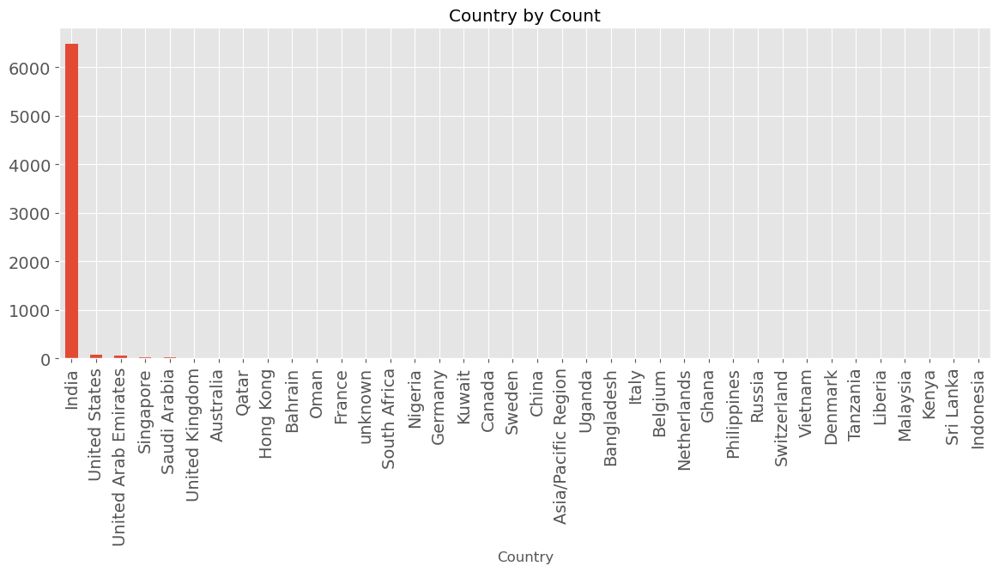

In [49]:
plt.figure(figsize=(14,5))
temp_cat_df.Country.value_counts().plot(kind = 'bar').set(title = "Country by Count")
plt.xticks(size = 14)
plt.yticks(size = 14)
plt.show()

Based on the above count plot we can say that mostly audience are from "India".

In [50]:
px.pie(data_frame = temp_cat_df, names = 'Specialization', title = 'Specialization Distribution')

When it comes to Specialization, we have ~16% Null values and 21% people have not selected the values. But apart from that Finance Management, HR & Marketing Management are the most popular specialization among the users.

In [51]:
px.pie(data_frame = temp_cat_df, names = 'Lead Profile', title = 'Lead Profile Distribution')

When it comes to Lead Profile Distribution, we have 29.3% Null Values with ~45% have not selected the values.

In [52]:
px.histogram(data_frame = temp_cat_df, x = 'Lead Source', title = 'Lead Source Distribution')

In our data "Google" is the most popular lead source destination followed by "Direct Traffic", "Olark Chat" and "Organic Search". One thing to note here is that we have not included the null values.

In [53]:
px.histogram(data_frame = temp_cat_df, x = 'Last Activity', title = 'Last Activity Distribution')

In [54]:
px.pie(temp_cat_df, 'What matters most to you in choosing a course', title = 'What matters most to you in choosing a course')

The one most important point to note here is that the prospects who have filled the lead form for course inquiry are looking for "Better Career Prospects" which is obvious that's what we human are. We always seek to look for better opportunity.

In [55]:
px.pie(temp_cat_df, 'What is your current occupation', title = 'What is your current occupation')

In [56]:
px.pie(data_frame = temp_cat_df, names = 'How did you hear about X Education', title = 'How did you hear about X Education')

When it comes to user acquistion medium, if we exclude the not "selected" and "null" values, the "Online Search" is the most popular user acquisiton medium followed by "Word of Mouth".

So now we have a fair understanding of our categorical data and we also know some of the reason behind the null values which is more important as a analyst before taking any preprocessing or feature engineering step. Now we are going to impute our categorical data and then we are going to club our numerical and categorical data for final EDA process.

### Categorical Data Feature Engineering - II (Imputation + EDA)

In [57]:
idx = cat_df.isnull().sum()[cat_df.isnull().sum() < 1].keys()

In [58]:
temp_cat_df = pd.concat([temp_cat_df, cat_df[idx]], axis = 1)

In [59]:
#lets once again take a look at the null values

temp_cat_df.isnull().sum()

Tags                                             3353
Lead Profile                                     2709
What matters most to you in choosing a course    2709
What is your current occupation                  2690
Country                                          2461
How did you hear about X Education               2207
Specialization                                   1438
City                                             1420
Last Activity                                     103
Lead Source                                        36
Prospect ID                                         0
Lead Origin                                         0
Do Not Email                                        0
Do Not Call                                         0
Search                                              0
Magazine                                            0
Newspaper Article                                   0
X Education Forums                                  0
Newspaper                   

In [60]:
#Let's first impute the Lead Source
temp_cat_df['Lead Source'].value_counts()

Lead Source
Google               2868
Direct Traffic       2543
Olark Chat           1755
Organic Search       1154
Reference             534
Welingak Website      142
Referral Sites        125
Facebook               55
bing                    6
google                  5
Click2call              4
Press_Release           2
Social Media            2
Live Chat               2
youtubechannel          1
testone                 1
Pay per Click Ads       1
welearnblog_Home        1
WeLearn                 1
blog                    1
NC_EDM                  1
Name: count, dtype: int64

As you can see here, we have same lead source named as 2 different which we can combine. So let's first combine them both.

In [61]:
temp_cat_df['Lead Source'].replace(to_replace = 'google', value = 'Google', inplace = True)

In [62]:
temp_cat_df['Lead Source'].value_counts()

Lead Source
Google               2873
Direct Traffic       2543
Olark Chat           1755
Organic Search       1154
Reference             534
Welingak Website      142
Referral Sites        125
Facebook               55
bing                    6
Click2call              4
Social Media            2
Live Chat               2
Press_Release           2
Pay per Click Ads       1
blog                    1
WeLearn                 1
welearnblog_Home        1
youtubechannel          1
testone                 1
NC_EDM                  1
Name: count, dtype: int64

See, it seems much fine now. Now for the 36 values which are null, what we can do is we can introduce a new lead source named "Others".

In [63]:
temp_cat_df['Lead Source'].replace(to_replace = np.nan, value = 'Others', inplace = True)

In [64]:
temp_cat_df['Lead Source'].value_counts()

Lead Source
Google               2873
Direct Traffic       2543
Olark Chat           1755
Organic Search       1154
Reference             534
Welingak Website      142
Referral Sites        125
Facebook               55
Others                 36
bing                    6
Click2call              4
Press_Release           2
Social Media            2
Live Chat               2
youtubechannel          1
testone                 1
Pay per Click Ads       1
welearnblog_Home        1
WeLearn                 1
blog                    1
NC_EDM                  1
Name: count, dtype: int64

Now we are going to impute the "Last Activity" column but the imputation will going to be done on using the secondary column which is more correlated with our 'Last Activity' column which is 'Tags'. So based on tags we will going to impute the 'Last Activity' by using the most frequent item.

In [65]:
temp_cat_df[temp_cat_df['Last Activity'].isnull()]

,Tags,Lead Profile,What matters most to you in choosing a course,What is your current occupation,Country,How did you hear about X Education,Specialization,City,Last Activity,Lead Source,...,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Update me on Supply Chain Content,Get updates on DM Content,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
77,NaN,Select,Better Career Prospects,Unemployed,NaN,Select,Select,Select,NaN,Welingak Website,...,No,No,No,No,No,No,No,No,No,Modified
79,Will revert after reading the email,Potential Lead,Better Career Prospects,Working Professional,NaN,Select,Hospitality Management,Thane & Outskirts,NaN,Reference,...,No,No,No,No,No,No,No,No,No,Modified
81,NaN,Select,Better Career Prospects,Unemployed,NaN,Select,Select,Select,NaN,Welingak Website,...,No,No,No,No,No,No,No,No,No,Modified
88,Closed by Horizzon,Lateral Student,Better Career Prospects,Unemployed,NaN,Select,Human Resource Management,Mumbai,NaN,Reference,...,No,No,No,No,No,No,No,No,No,Modified
120,Closed by Horizzon,Potential Lead,Better Career Prospects,Working Professional,NaN,Select,Marketing Management,Other Cities,NaN,Reference,...,No,No,No,No,No,No,No,No,No,Modified
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8097,Interested in full time MBA,Select,Better Career Prospects,Unemployed,NaN,Select,Marketing Management,Select,NaN,Reference,...,No,No,No,No,No,No,No,No,No,Modified
8107,Lost to EINS,Potential Lead,Better Career Prospects,Working Professional,NaN,Select,"Banking, Investment And Insurance",Select,NaN,Reference,...,No,No,No,No,No,No,No,No,No,Modified
8434,Closed by Horizzon,Select,Better Career Prospects,Unemployed,NaN,Select,Select,Select,NaN,Reference,...,No,No,No,No,No,No,No,No,No,Modified
9015,Closed by Horizzon,Potential Lead,Better Career Prospects,Working Professional,NaN,Select,Supply Chain Management,Mumbai,NaN,Reference,...,No,No,No,No,No,No,No,No,No,Modified


In [66]:
temp_cat_df[temp_cat_df['Last Activity'].isnull()]['Tags'].value_counts()

Tags
Closed by Horizzon                     47
Will revert after reading the email    26
Ringing                                12
Interested in other courses             4
Lost to EINS                            2
number not provided                     1
Busy                                    1
Interested  in full time MBA            1
Name: count, dtype: int64

Now let's find out corresponding most frequent item under the "Last Activity so that we can impute the missing values.

In [67]:
print(temp_cat_df[(temp_cat_df['Tags'] == 'Closed by Horizzon')]['Last Activity'].mode())
print(temp_cat_df[(temp_cat_df['Tags'] == 'Will revert after reading the email')]['Last Activity'].mode())
print(temp_cat_df[(temp_cat_df['Tags'] == 'Ringing')]['Last Activity'].mode())
print(temp_cat_df[(temp_cat_df['Tags'] == 'Interested in other courses')]['Last Activity'].mode())
print(temp_cat_df[(temp_cat_df['Tags'] == 'number not provided')]['Last Activity'].mode())
print(temp_cat_df[(temp_cat_df['Tags'] == 'Busy')]['Last Activity'].mode())
print(temp_cat_df[(temp_cat_df['Tags'] == 'Interested  in full time MBA')]['Last Activity'].mode())

0    Email Opened
Name: Last Activity, dtype: object
0    SMS Sent
Name: Last Activity, dtype: object
0    Email Opened
Name: Last Activity, dtype: object
0    Email Opened
Name: Last Activity, dtype: object
0    SMS Sent
Name: Last Activity, dtype: object
0    SMS Sent
Name: Last Activity, dtype: object
0    Email Opened
Name: Last Activity, dtype: object


In [68]:
temp_cat_df.loc[(temp_cat_df['Last Activity'].isnull()) & (temp_cat_df['Tags'] == 'Closed by Horizzon'), 'Last Activity'] = 'Email Opened'
temp_cat_df.loc[(temp_cat_df['Last Activity'].isnull()) & (temp_cat_df['Tags'] == 'Will revert after reading the email'), 'Last Activity'] = 'Email Opened'
temp_cat_df.loc[(temp_cat_df['Last Activity'].isnull()) & (temp_cat_df['Tags'] == 'Ringing'), 'Last Activity'] = 'SMS Sent'
temp_cat_df.loc[(temp_cat_df['Last Activity'].isnull()) & (temp_cat_df['Tags'] == 'Interested in other courses'), 'Last Activity'] = 'Email Opened'
temp_cat_df.loc[(temp_cat_df['Last Activity'].isnull()) & (temp_cat_df['Tags'] == 'Lost to EINS'), 'Last Activity'] = 'Email Opened'
temp_cat_df.loc[(temp_cat_df['Last Activity'].isnull()) & (temp_cat_df['Tags'] == 'number not provided'), 'Last Activity'] = 'SMS Sent'
temp_cat_df.loc[(temp_cat_df['Last Activity'].isnull()) & (temp_cat_df['Tags'] == 'Busy'), 'Last Activity'] = 'SMS Sent'
temp_cat_df.loc[(temp_cat_df['Last Activity'].isnull()) & (temp_cat_df['Tags'] == 'Interested  in full time MBA'), 'Last Activity'] = 'Email Opened'

In [69]:
temp_cat_df[temp_cat_df['Last Activity'].isnull()]

,Tags,Lead Profile,What matters most to you in choosing a course,What is your current occupation,Country,How did you hear about X Education,Specialization,City,Last Activity,Lead Source,...,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Update me on Supply Chain Content,Get updates on DM Content,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
77,NaN,Select,Better Career Prospects,Unemployed,NaN,Select,Select,Select,NaN,Welingak Website,...,No,No,No,No,No,No,No,No,No,Modified
81,NaN,Select,Better Career Prospects,Unemployed,NaN,Select,Select,Select,NaN,Welingak Website,...,No,No,No,No,No,No,No,No,No,Modified
134,NaN,Select,Better Career Prospects,Unemployed,NaN,Select,Select,Select,NaN,Welingak Website,...,No,No,No,No,No,No,No,No,No,Modified
179,NaN,Select,Better Career Prospects,Unemployed,NaN,Select,Select,Select,NaN,Welingak Website,...,No,No,No,No,No,No,No,No,No,Modified
180,NaN,Select,Better Career Prospects,Unemployed,NaN,Select,Select,Select,NaN,Welingak Website,...,No,No,No,No,No,No,No,No,No,Modified
994,NaN,Select,Better Career Prospects,Unemployed,NaN,Select,Select,Select,NaN,Welingak Website,...,No,No,No,No,No,No,No,No,No,Modified
1393,NaN,Select,Better Career Prospects,Unemployed,NaN,Select,Select,Select,NaN,Welingak Website,...,No,No,No,No,No,No,No,No,No,Modified
2942,NaN,Select,Better Career Prospects,Unemployed,NaN,Select,Select,Select,NaN,Reference,...,No,No,No,No,No,No,No,No,No,Modified
5840,NaN,Select,Better Career Prospects,Unemployed,NaN,Select,Select,Select,NaN,Others,...,No,No,No,No,No,No,No,No,No,Modified


In [70]:
(temp_cat_df[(temp_cat_df['What matters most to you in choosing a course'] == 'Better Career Prospects') & (temp_cat_df['What is your current occupation'] == 'Unemployed')]['Last Activity']).mode()

0    Email Opened
Name: Last Activity, dtype: object

In [71]:
temp_cat_df['Last Activity'].replace(to_replace = np.nan, value = 'Email Opened', inplace = True)

In [72]:
fig = make_subplots(rows=1, cols=2, specs=[[{"type": "pie"}, {"type": "pie"}]], column_titles = ['Before Manual Imputation', 'After Manual Imputation'], )

fig.add_trace(

    go.Pie(labels = cat_df['Last Activity']), row = 1, col = 1
)

fig.add_trace(

    go.Pie(labels = temp_cat_df['Last Activity']), row = 1, col = 2
)

fig.update_layout(title_text = 'Last Activity Imputation', showlegend=False)

In [73]:

temp_cat_df.isnull().sum()/temp_cat_df.shape[0]

Tags                                             0.362879
Lead Profile                                     0.293182
What matters most to you in choosing a course    0.293182
What is your current occupation                  0.291126
Country                                          0.266342
How did you hear about X Education               0.238853
Specialization                                   0.155628
City                                             0.153680
Last Activity                                    0.000000
Lead Source                                      0.000000
Prospect ID                                      0.000000
Lead Origin                                      0.000000
Do Not Email                                     0.000000
Do Not Call                                      0.000000
Search                                           0.000000
Magazine                                         0.000000
Newspaper Article                                0.000000
X Education Fo

In [74]:

cat_df_copy = temp_cat_df.copy()

In [75]:
cat_df_copy.drop("Country", axis = 1, inplace = True)

In [76]:
# we are creating a new variable for those values which are either 'Select' or 'NaN' for these 4 columns.
cat_df_copy['City'].replace(to_replace = ['Select', np.nan], value = 'Unspecified', inplace = True)
cat_df_copy['Specialization'].replace(to_replace = ['Select', np.nan], value = 'Unspecified', inplace = True)
cat_df_copy['Lead Profile'].replace(to_replace = ['Select', np.nan], value = 'Unspecified', inplace = True)
cat_df_copy['How did you hear about X Education'].replace(to_replace = ['Select', np.nan], value = 'Unspecified', inplace = True)

#imputing with most frequent item in a itemset
cat_df_copy["What matters most to you in choosing a course"].replace(to_replace = np.nan, value = 'Better Career Prospects', inplace = True)
cat_df_copy["What is your current occupation"].replace(to_replace = np.nan, value = 'Unemployed', inplace = True)

In [77]:
#imputing the frequent value in case of any null values present in our data
(cat_df_copy.isnull().sum()/cat_df_copy.shape[0]).sort_values(ascending = False)

Tags                                             0.362879
Lead Profile                                     0.000000
A free copy of Mastering The Interview           0.000000
I agree to pay the amount through cheque         0.000000
Get updates on DM Content                        0.000000
Update me on Supply Chain Content                0.000000
Receive More Updates About Our Courses           0.000000
Through Recommendations                          0.000000
Digital Advertisement                            0.000000
Newspaper                                        0.000000
X Education Forums                               0.000000
Newspaper Article                                0.000000
Magazine                                         0.000000
Search                                           0.000000
Do Not Call                                      0.000000
Do Not Email                                     0.000000
Lead Origin                                      0.000000
Prospect ID   

In [78]:
pd.set_option('display.max_columns', 500)

In [79]:
#dropping prospect id as we have lead number so these 2 will be the same for the identification
cat_df_copy.drop('Prospect ID', axis = 1, inplace = True)

In [80]:
encoder = OrdinalEncoder()

In [81]:
temp_df = cat_df_copy.copy()

In [82]:
temp_df['Tags'].replace(to_replace = np.nan, value = 'nan', inplace = True)
encode_df = pd.DataFrame(encoder.fit_transform(temp_df), columns = temp_df.columns)
encode_df.Tags.replace(to_replace = 22.0, value = np.nan, inplace = True)
check_str(encode_df, 'Tags')

Alert: Float/Int Values Found in Categorical Column..!!!


In [83]:
knn_imputer = KNN(k = 6)

In [84]:
impute_data = knn_imputer.fit_transform(encode_df)

Imputing row 1/9240 with 0 missing, elapsed time: 20.947
Imputing row 101/9240 with 0 missing, elapsed time: 20.951
Imputing row 201/9240 with 0 missing, elapsed time: 20.956
Imputing row 301/9240 with 1 missing, elapsed time: 20.961
Imputing row 401/9240 with 0 missing, elapsed time: 20.968
Imputing row 501/9240 with 0 missing, elapsed time: 20.973
Imputing row 601/9240 with 0 missing, elapsed time: 20.979
Imputing row 701/9240 with 0 missing, elapsed time: 20.986
Imputing row 801/9240 with 1 missing, elapsed time: 20.991
Imputing row 901/9240 with 0 missing, elapsed time: 20.996
Imputing row 1001/9240 with 0 missing, elapsed time: 20.999
Imputing row 1101/9240 with 1 missing, elapsed time: 21.004
Imputing row 1201/9240 with 0 missing, elapsed time: 21.010
Imputing row 1301/9240 with 0 missing, elapsed time: 21.017
Imputing row 1401/9240 with 0 missing, elapsed time: 21.023
Imputing row 1501/9240 with 1 missing, elapsed time: 21.027
Imputing row 1601/9240 with 0 missing, elapsed time:

In [85]:
impute_df = pd.DataFrame(np.round(impute_data, 1), columns = temp_df.columns)

In [86]:
impute_df = pd.DataFrame(encoder.inverse_transform(impute_df), columns = impute_df.columns)

In [87]:
impute_df['Tags'].replace(to_replace = 'nan', value = 'Will revert after reading the email', inplace = True)

Now we are done with the feature engineering so let's merge the data.

In [88]:

final_df = pd.concat([num_df, impute_df], axis = 1)

In [89]:
final_df.head()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Tags,Lead Profile,What matters most to you in choosing a course,What is your current occupation,How did you hear about X Education,Specialization,City,Last Activity,Lead Source,Lead Origin,Do Not Email,Do Not Call,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Update me on Supply Chain Content,Get updates on DM Content,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,660737,0,0.0,0,0.0,Interested in other courses,Unspecified,Better Career Prospects,Unemployed,Unspecified,Unspecified,Unspecified,Page Visited on Website,Olark Chat,API,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Modified
1,660728,0,5.0,674,2.5,Ringing,Unspecified,Better Career Prospects,Unemployed,Unspecified,Unspecified,Unspecified,Email Opened,Organic Search,API,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Email Opened
2,660727,1,2.0,1532,2.0,Will revert after reading the email,Potential Lead,Better Career Prospects,Student,Unspecified,Business Administration,Mumbai,Email Opened,Direct Traffic,Landing Page Submission,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Email Opened
3,660719,0,1.0,305,1.0,Ringing,Unspecified,Better Career Prospects,Unemployed,Word Of Mouth,Media and Advertising,Mumbai,Unreachable,Direct Traffic,Landing Page Submission,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Modified
4,660681,1,2.0,1428,1.0,Will revert after reading the email,Unspecified,Better Career Prospects,Unemployed,Other,Unspecified,Mumbai,Converted to Lead,Google,Landing Page Submission,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Modified


In [219]:
final_df.isnull().sum()

Lead Number                                      0
TotalVisits                                      0
Total Time Spent on Website                      0
Page Views Per Visit                             0
Tags                                             0
Lead Profile                                     0
What matters most to you in choosing a course    0
What is your current occupation                  0
How did you hear about X Education               0
Specialization                                   0
City                                             0
Last Activity                                    0
Lead Source                                      0
Lead Origin                                      0
Do Not Email                                     0
Do Not Call                                      0
Search                                           0
Magazine                                         0
Newspaper Article                                0
X Education Forums             

In [90]:
final_df = final_df.iloc[:, [0,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29, 1]]

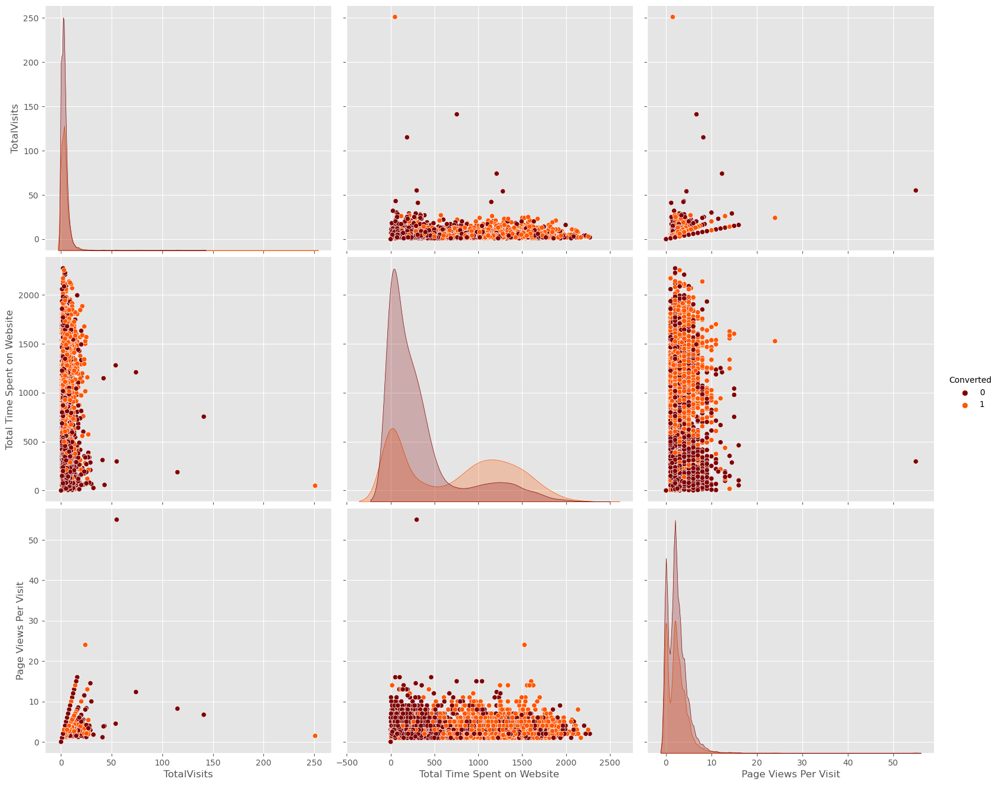

In [91]:
sns.pairplot(final_df.iloc[:, [1,2,3,-1]], hue = 'Converted', palette = 'gist_heat', height = 4.5, aspect = 1.2)

We can clearly see some of the potential outliers in our data also the data seems to be skewed for the different classes.

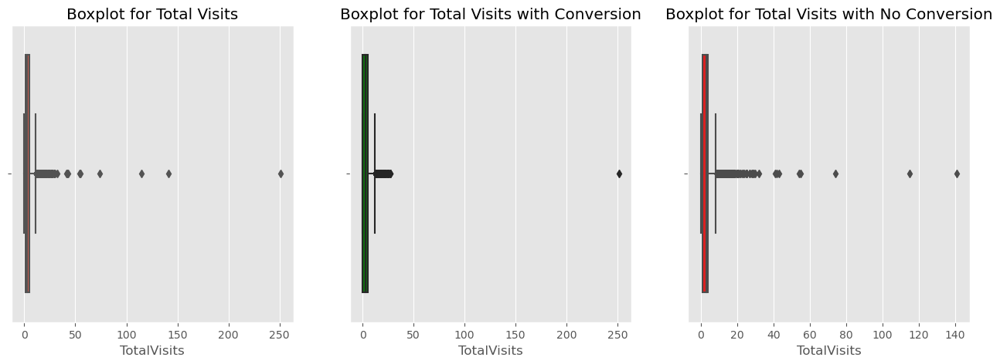

In [92]:
plt.figure(figsize=(16,5))
plt.subplot(131)
plt.title("Boxplot for Total Visits")
sns.boxplot(data = final_df, x = 'TotalVisits')
plt.subplot(132)
plt.title("Boxplot for Total Visits with Conversion")
sns.boxplot(data = final_df.query("Converted == 1"), x = 'TotalVisits', hue = 'Converted', color = 'g')
plt.subplot(133)
plt.title("Boxplot for Total Visits with No Conversion")
sns.boxplot(data = final_df.query("Converted == 0"), x = 'TotalVisits', hue = 'Converted', color = 'r')
plt.show()

As we already see in our pairplot for the extreme values but via this boxplot, now we are clearly see some high extreme values in our data for the Total Visits.

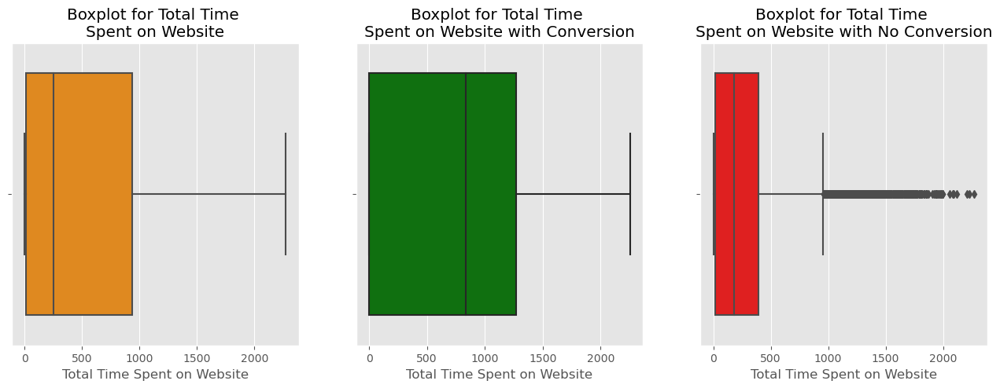

In [93]:
plt.figure(figsize=(16,5))
plt.subplot(131)
plt.title("Boxplot for Total Time \nSpent on Website")
sns.boxplot(data = final_df, x = 'Total Time Spent on Website', color = 'darkorange')
plt.subplot(132)
plt.title("Boxplot for Total Time \nSpent on Website with Conversion")
sns.boxplot(data = final_df.query("Converted == 1"), x = 'Total Time Spent on Website', hue = 'Converted', color = 'g')
plt.subplot(133)
plt.title("Boxplot for Total Time \nSpent on Website with No Conversion")
sns.boxplot(data = final_df.query("Converted == 0"), x = 'Total Time Spent on Website', hue = 'Converted', color = 'r')
plt.show()

Here we can see some potential outliers for the class with "No Conversion" but when we look data at the aggregate level the effect of "No Conversion" seems to be neutralize because of "Conversion class seems to be far less skewed as compared to "No Conversion" class.

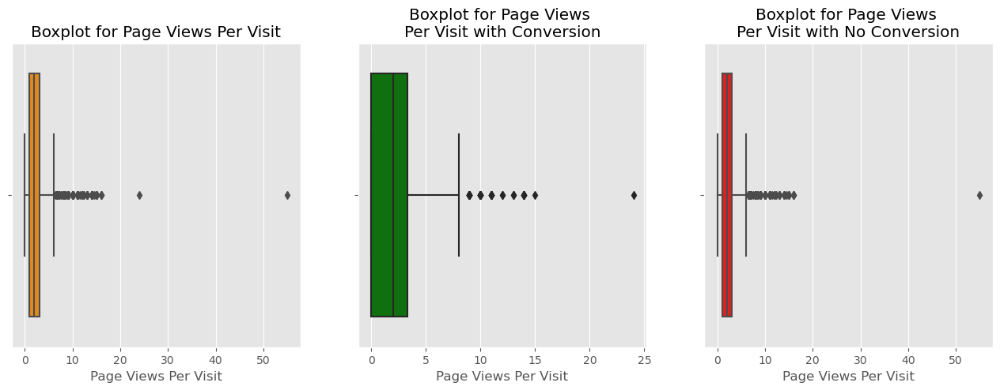

In [94]:
plt.figure(figsize=(16,5))
plt.subplot(131)
plt.title("Boxplot for Page Views Per Visit")
sns.boxplot(data = final_df, x = 'Page Views Per Visit', color = 'darkorange')
plt.subplot(132)
plt.title("Boxplot for Page Views \nPer Visit with Conversion")
sns.boxplot(data = final_df.query("Converted == 1"), x = 'Page Views Per Visit', hue = 'Converted', color = 'g')
plt.subplot(133)
plt.title("Boxplot for Page Views \nPer Visit with No Conversion")
sns.boxplot(data = final_df.query("Converted == 0"), x = 'Page Views Per Visit', hue = 'Converted', color = 'r')
plt.show()

We can also see some extreme values here as well which indicated that we need to fix these outliers before procedding with our analysis.

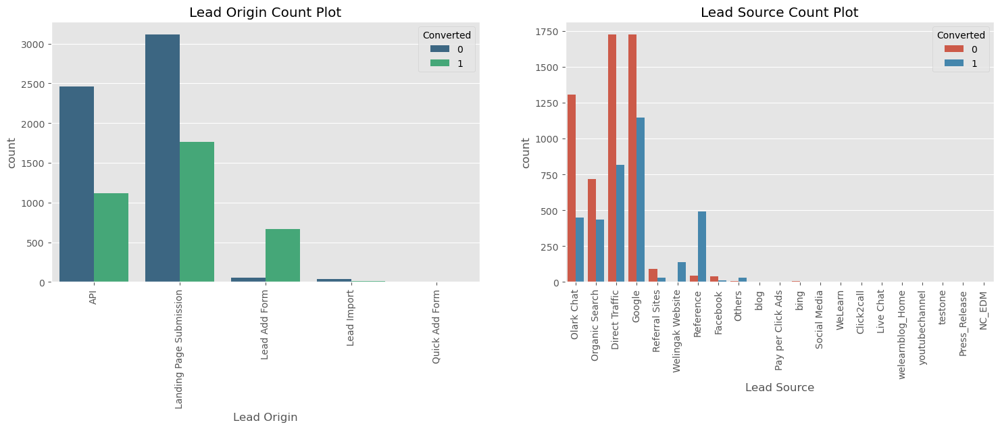

In [95]:
plt.figure(figsize=(18,5))
plt.subplot(121)
plt.title("Lead Origin Count Plot")
sns.countplot(data = final_df, x = 'Lead Origin', hue = 'Converted', palette = 'viridis')
plt.xticks(rotation = 'vertical')
plt.subplot(122)
plt.title("Lead Source Count Plot")
sns.countplot(data = final_df, x = 'Lead Source', hue = 'Converted')
plt.xticks(rotation = 'vertical')
plt.show()

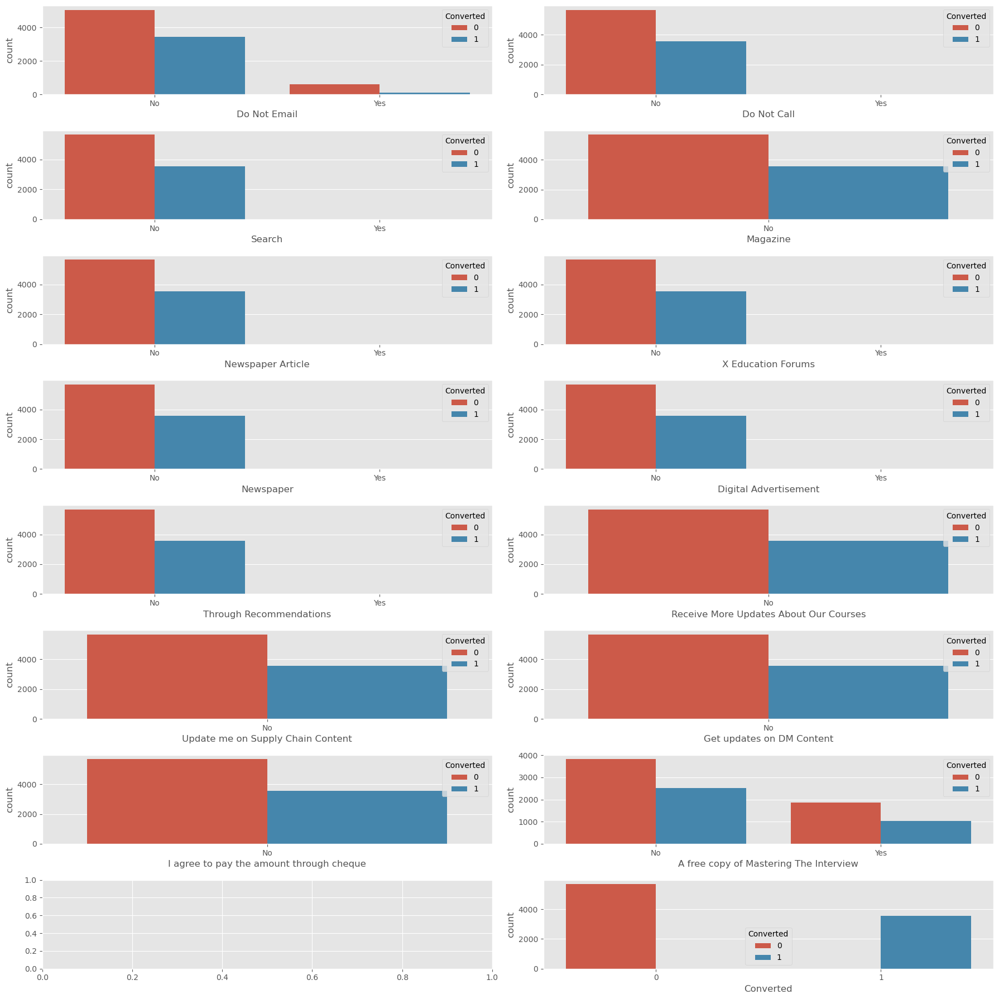

In [96]:
fig, ax = plt.subplots(8, 2, figsize=(18,18))
axes_ = [axes_row for axes in ax for axes_row in axes]

for idx, val in enumerate(final_df.iloc[:, 14:].columns):
    if val == 'Last Notable Activity':
        continue
    else:
        g = sns.countplot(data = final_df, x = val, hue = 'Converted', ax = axes_[idx])
        plt.tight_layout()

Based on that we can see that the proportional of users who not converted is high as compared to the users who converted. Also, the users are not much interested in "Free Copy of Mastering the Interview" which is weired because who does not like freebies. The reason maybe we have large proportion of audience who are "Unemployed" and the only thing they are interested about upskilling themeselves and not giving priority to the interview preparation on the early stage. Also, there are certain columns from which we are not going to inference much information as most of the values are "No" so we will going to drop the same in the later stage.

### Outlier Analysis

In [97]:
def check_outlier(data, col):
    
    #calculating quartile deviation
    q1 = np.quantile(data[col], q = 0.25)
    q3 = np.quantile(data[col], q = 0.75)
    
    #calculating inter-quartile range
    iqr = q3-q1
    
    #calculating lower and upper bound
    lower_bound = q1 - 1.5*iqr
    upper_bound = q3 + 1.5*iqr
    
    #filtering data with outliers
    outlier = data[col][(data[col] < lower_bound) | (data[col] > upper_bound)]
    
    #plotting the result
    plt.figure(figsize=(14,8))
    plt.subplot(211)
    plt.title("%s with Outliers" %(col))
    plt.plot(data[col])
    sns.scatterplot(data = outlier, x = outlier.index, y = outlier.values, marker = 'X', color = 'k', s=70)
    plt.subplot(212)
    sns.boxplot(data = data, x = col, color = 'g')
    plt.show()

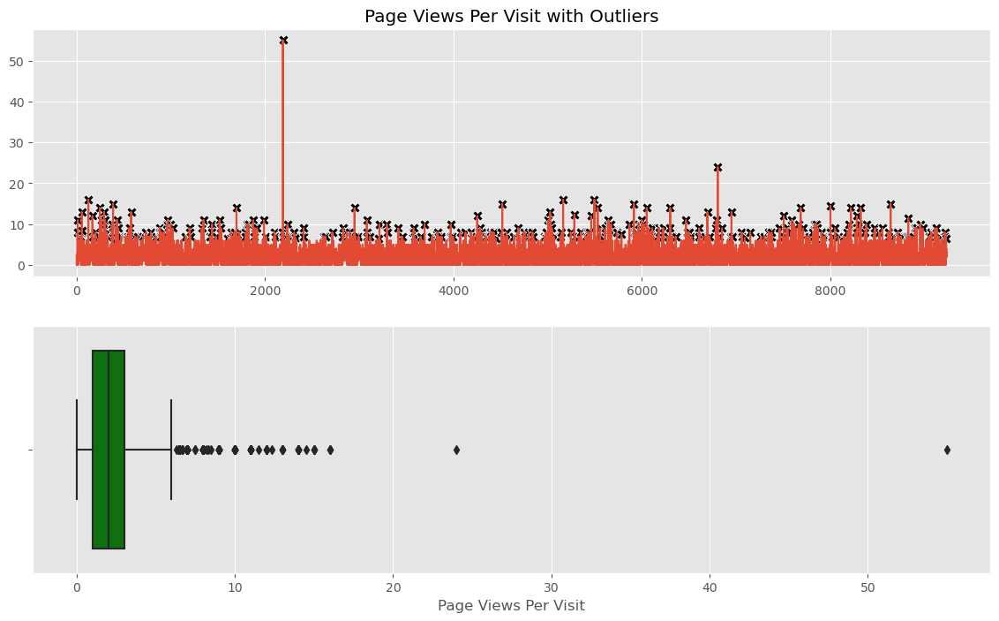

In [98]:
check_outlier(final_df, 'Page Views Per Visit')

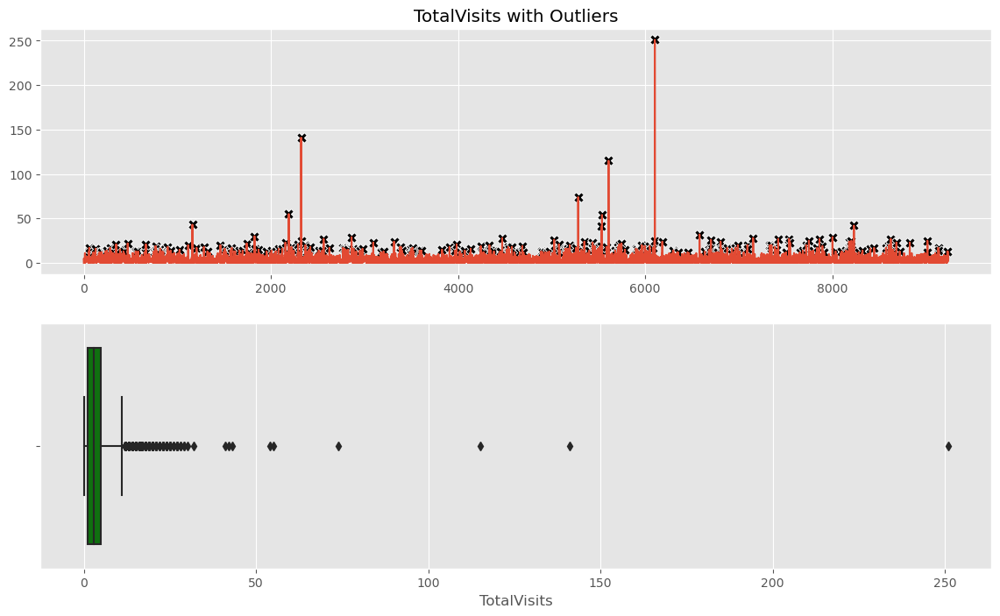

In [99]:
check_outlier(final_df, 'TotalVisits')

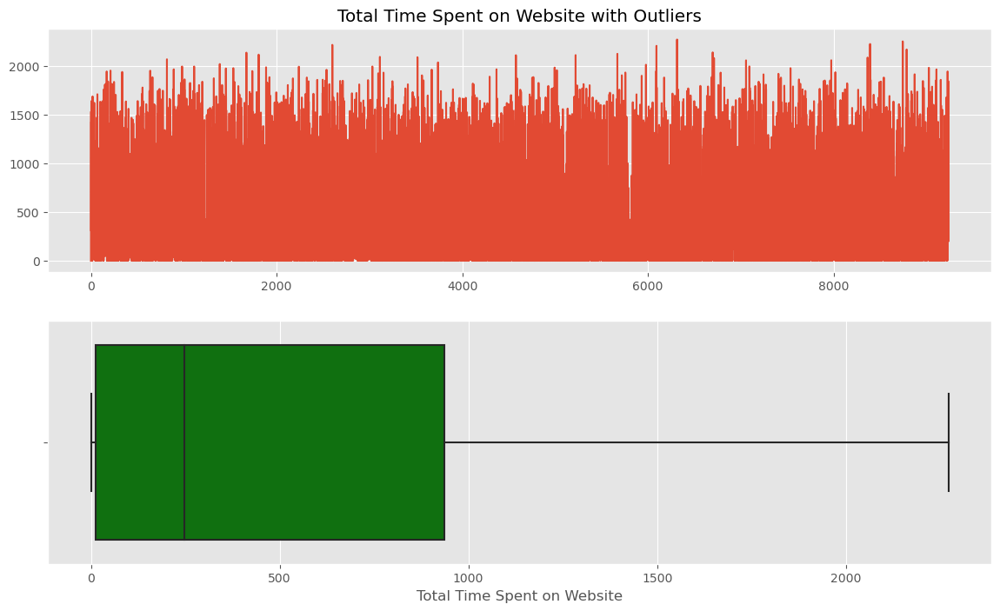

In [100]:
check_outlier(final_df, 'Total Time Spent on Website')

In [101]:
final_df.iloc[:, [1,2,3]].describe(percentiles = [0.01, 0.1, 0.25, 0.75, 0.90, 0.95, 0.99]).T

,count,mean,std,min,1%,10%,25%,50%,75%,90%,95%,99%,max
TotalVisits,9240.0,3.438636,4.819024,0.0,0.0,0.0,1.0,3.0,5.0,7.0,10.0,17.00,251.0
Total Time Spent on Website,9240.0,487.698268,548.021466,0.0,0.0,0.0,12.0,248.0,936.0,1380.0,1562.0,1840.61,2272.0
Page Views Per Visit,9240.0,2.357440,2.145781,0.0,0.0,0.0,1.0,2.0,3.0,5.0,6.0,9.00,55.0


As we can see here how the values are changing from 99 percentile to max which indicates there is something wrong in our data. The sudden increase in our values from 99 percentile to max will make our distribution skewed so we need to fix it.

In [102]:
anomaly_data = final_df.iloc[:, [1,2,3]]

In [103]:
y = final_df.iloc[:, -1]

In [104]:
se = StandardScaler()

In [105]:
le = LogisticRegression(random_state = 42)

In [106]:
scaled_df = pd.DataFrame(se.fit_transform(anomaly_data), columns = anomaly_data.columns)

In [107]:
contamination = [0.1,0.01,0.001,0.05,0.005,0.0001]
k_neighbor = [3,5,7,9, 12, 15, 18, 21, 25]

In [108]:
lof_params = list(product(contamination, k_neighbor))

In [109]:
scores = []

In [110]:
for c, k in lof_params:
    
    lof = LocalOutlierFactor(n_neighbors=k, contamination=c, n_jobs = -1)
    predict = lof.fit_predict(scaled_df)
    mask = pd.DataFrame(predict)
    mask.columns = ["anomaly"]
    filter_df = pd.concat([scaled_df, mask], axis = 1).query('anomaly == 1').reset_index().drop("index", axis = 1)
    filter_y = pd.concat([y, mask], axis = 1).query('anomaly == 1').reset_index().drop("index", axis = 1)
    filter_df = filter_df.iloc[:, :3]
    filter_y = filter_y.iloc[:, :1]
    cv_score = cross_val_score(estimator= le, X = filter_df, y = filter_y, cv = 10, scoring = 'accuracy')
    scores.append(np.mean(cv_score))
    print(np.mean(cv_score))

0.7103204838933629
0.7132065456354717
0.7127254871332037
0.7133268825789132
0.7135681350087939
0.7142884210404518
0.714288565676201
0.7120192307692308
0.7130853408775341
0.7152227551483045
0.716521385610599
0.7157565974339659
0.7160848250050819
0.7158663653429947
0.7165219834750272
0.716412335138884
0.7157563582881945
0.7153191998182491
0.7158179848320694
0.7157374315825019
0.7163596966413868
0.7164680390032502
0.7165763813651137
0.7164680390032502
0.7164680390032502
0.7165763813651137
0.7164680390032502
0.7132610654981909
0.7145785876993166
0.714321057238515
0.7155409178629778
0.7153131274301758
0.7155407879938598
0.7146623532803641
0.7156874102279722
0.7139456056186576
0.7159474578671576
0.7160892037659081
0.7154363201968112
0.7157625254293418
0.7157625254293418
0.7159803898377253
0.7157628802573686
0.7157627619813597
0.7156537115011591
0.7162049218387245
0.7161255411255412
0.7160966967304996
0.7160966967304996
0.7162049218387246
0.7162049218387246
0.7162049218387246
0.71620492183872

In [111]:
param_df = pd.DataFrame(lof_params, columns = ["contamination", "neighbors"])

In [112]:
scores_df = pd.DataFrame(scores, columns = ["scores"])

In [113]:
lof_perf_df = pd.concat([param_df, scores_df], axis = 1)

In [114]:
lof_perf_df

,contamination,neighbors,scores
0,0.1000,3,0.710320
1,0.1000,5,0.713207
2,0.1000,7,0.712725
3,0.1000,9,0.713327
4,0.1000,12,0.713568
5,0.1000,15,0.714288
6,0.1000,18,0.714289
7,0.1000,21,0.712019
8,0.1000,25,0.713085
9,0.0100,3,0.715223


In [115]:
lof_pivot = pd.pivot_table(data = lof_perf_df, index = 'contamination', columns = 'neighbors', values = 'scores')

In [116]:
lof_pivot

neighbors,3,5,7,9,12,15,18,21,25
contamination,,,,,,,,,
0.0001,0.716205,0.716126,0.716097,0.716097,0.716205,0.716205,0.716205,0.716205,0.716205
0.0010,0.715818,0.715737,0.716360,0.716468,0.716576,0.716468,0.716468,0.716576,0.716468
0.0050,0.715947,0.716089,0.715436,0.715763,0.715763,0.715980,0.715763,0.715763,0.715654
0.0100,0.715223,0.716521,0.715757,0.716085,0.715866,0.716522,0.716412,0.715756,0.715319
0.0500,0.713261,0.714579,0.714321,0.715541,0.715313,0.715541,0.714662,0.715687,0.713946
0.1000,0.710320,0.713207,0.712725,0.713327,0.713568,0.714288,0.714289,0.712019,0.713085


<Axes: xlabel='neighbors', ylabel='contamination'>

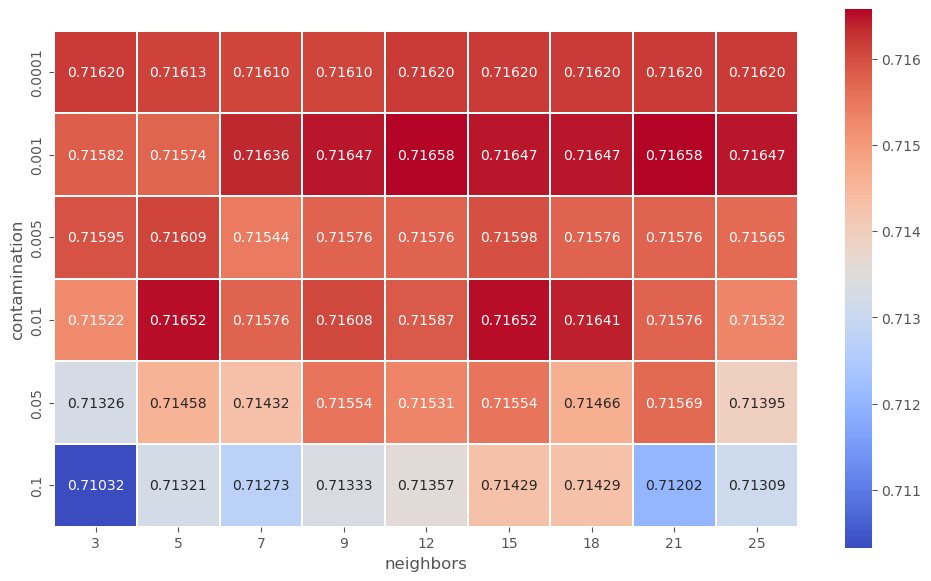

In [117]:
plt.figure(figsize=(12,7))
sns.heatmap(lof_pivot, annot = True, fmt = ".5f", cmap = 'coolwarm', square = True, linewidths=0.025)

In [118]:
lof = LocalOutlierFactor(contamination=0.001, n_neighbors=21, n_jobs = -1)

In [119]:
lof_fit = lof.fit_predict(scaled_df)

In [120]:
anomaly_label = pd.DataFrame(lof_fit, columns = ["anomaly"])

In [121]:
final_df.loc[:, "anomaly"] = anomaly_label

In [122]:
final_df.head()

,Lead Number,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Tags,Lead Profile,What matters most to you in choosing a course,What is your current occupation,How did you hear about X Education,Specialization,City,Last Activity,Lead Source,Lead Origin,Do Not Email,Do Not Call,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Update me on Supply Chain Content,Get updates on DM Content,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity,Converted,anomaly
0,660737,0.0,0,0.0,Interested in other courses,Unspecified,Better Career Prospects,Unemployed,Unspecified,Unspecified,Unspecified,Page Visited on Website,Olark Chat,API,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Modified,0,1
1,660728,5.0,674,2.5,Ringing,Unspecified,Better Career Prospects,Unemployed,Unspecified,Unspecified,Unspecified,Email Opened,Organic Search,API,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Email Opened,0,1
2,660727,2.0,1532,2.0,Will revert after reading the email,Potential Lead,Better Career Prospects,Student,Unspecified,Business Administration,Mumbai,Email Opened,Direct Traffic,Landing Page Submission,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Email Opened,1,1
3,660719,1.0,305,1.0,Ringing,Unspecified,Better Career Prospects,Unemployed,Word Of Mouth,Media and Advertising,Mumbai,Unreachable,Direct Traffic,Landing Page Submission,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Modified,0,1
4,660681,2.0,1428,1.0,Will revert after reading the email,Unspecified,Better Career Prospects,Unemployed,Other,Unspecified,Mumbai,Converted to Lead,Google,Landing Page Submission,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Modified,1,1


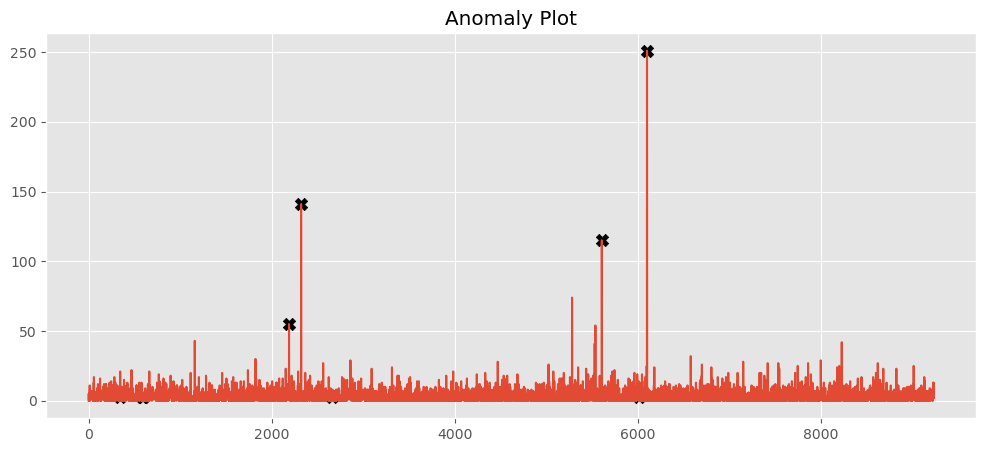

In [123]:
plt.figure(figsize=(12,5))
plt.title("Anomaly Plot")
plt.plot(final_df["TotalVisits"])
plt.scatter(x = final_df[final_df["anomaly"] == -1]["TotalVisits"].index, y = final_df[final_df["anomaly"] == -1]["TotalVisits"].values, marker = "X", color = 'k', s = 80)

In [124]:
anomaly_idx = final_df[final_df["anomaly"] == -1].index

In [247]:
final_df.shape

(9240, 31)

In [248]:
filter_df = final_df.drop(anomaly_idx, axis = 0).reset_index().drop("index", axis = 1)

In [249]:
filter_df.isnull().sum()

Lead Number                                      0
TotalVisits                                      0
Total Time Spent on Website                      0
Page Views Per Visit                             0
Tags                                             0
Lead Profile                                     0
What matters most to you in choosing a course    0
What is your current occupation                  0
How did you hear about X Education               0
Specialization                                   0
City                                             0
Last Activity                                    0
Lead Source                                      0
Lead Origin                                      0
Do Not Email                                     0
Do Not Call                                      0
Search                                           0
Magazine                                         0
Newspaper Article                                0
X Education Forums             

In [250]:
filter_df.drop("anomaly", axis = 1, inplace = True)

In [251]:
filter_df.iloc[:, :-1].describe()

,Lead Number,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9230.000000,9230.000000,9230.000000,9230.000000
mean,617169.918960,3.379523,488.069339,2.350959
std,23401.760534,3.594001,548.153831,2.074395
min,579533.000000,0.000000,0.000000,0.000000
25%,596475.750000,1.000000,12.000000,1.000000
50%,615470.500000,3.000000,249.000000,2.000000
75%,637372.250000,5.000000,936.750000,3.000000
max,660737.000000,74.000000,2272.000000,24.000000


We are at the end of our EDA, Feature Engineering & Outlier Analysis Part but for the Outlier Analysis, we have detected some extreme outliers using LOF and removed them from our data but still there are some extreme values based on the boxplot but for this analysis, we are keeping those extreme values and build our model if our model did not perform well than in that case we will going to tweak our model by removing these extreme values or applying winzoriazation on it.

In [252]:
drop_cols = ["Do Not Call", "Search", "Magazine", "Newspaper Article", "X Education Forums", "Newspaper",
             "Digital Advertisement", "Through Recommendations", "Receive More Updates About Our Courses",
            "Update me on Supply Chain Content", "Get updates on DM Content", "I agree to pay the amount through cheque"]

In [253]:
filter_df.drop(drop_cols, axis = 1, inplace = True)

In [254]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

In [255]:
cat_feature = filter_df.dtypes[filter_df.dtypes == 'object'].keys()

In [256]:
cat_feature

Index(['Tags', 'Lead Profile', 'What matters most to you in choosing a course',
       'What is your current occupation', 'How did you hear about X Education',
       'Specialization', 'City', 'Last Activity', 'Lead Source', 'Lead Origin',
       'Do Not Email', 'A free copy of Mastering The Interview',
       'Last Notable Activity'],
      dtype='object')

In [257]:
num_feature = filter_df.dtypes[(filter_df.dtypes == 'int64') | (filter_df.dtypes == 'float64')].keys()[[1,2,3]]

In [258]:
num_feature

Index(['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit'], dtype='object')

In [259]:
se = StandardScaler()

In [260]:
encode_num = pd.DataFrame(se.fit_transform(filter_df[num_feature]), columns = num_feature)

In [261]:
famd_df = pd.concat([encode_num, filter_df[cat_feature]], axis = 1)

In [262]:
famd_df

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Tags,Lead Profile,What matters most to you in choosing a course,What is your current occupation,How did you hear about X Education,Specialization,City,Last Activity,Lead Source,Lead Origin,Do Not Email,A free copy of Mastering The Interview,Last Notable Activity
0,-0.940374,-0.890436,-1.133384,Interested in other courses,Unspecified,Better Career Prospects,Unemployed,Unspecified,Unspecified,Unspecified,Page Visited on Website,Olark Chat,API,No,No,Modified
1,0.450908,0.339213,0.071852,Ringing,Unspecified,Better Career Prospects,Unemployed,Unspecified,Unspecified,Unspecified,Email Opened,Organic Search,API,No,No,Email Opened
2,-0.383861,1.904552,-0.169195,Will revert after reading the email,Potential Lead,Better Career Prospects,Student,Unspecified,Business Administration,Mumbai,Email Opened,Direct Traffic,Landing Page Submission,No,Yes,Email Opened
3,-0.662118,-0.333992,-0.651290,Ringing,Unspecified,Better Career Prospects,Unemployed,Word Of Mouth,Media and Advertising,Mumbai,Unreachable,Direct Traffic,Landing Page Submission,No,No,Modified
4,-0.383861,1.714813,-0.651290,Will revert after reading the email,Unspecified,Better Career Prospects,Unemployed,Other,Unspecified,Mumbai,Converted to Lead,Google,Landing Page Submission,No,No,Modified
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9225,1.285678,2.475590,0.153808,Will revert after reading the email,Potential Lead,Better Career Prospects,Unemployed,Unspecified,IT Projects Management,Mumbai,Email Marked Spam,Direct Traffic,Landing Page Submission,Yes,No,Email Marked Spam
9226,-0.383861,-0.456228,-0.169195,wrong number given,Potential Lead,Better Career Prospects,Unemployed,Unspecified,Media and Advertising,Mumbai,SMS Sent,Direct Traffic,Landing Page Submission,No,Yes,SMS Sent
9227,-0.383861,-0.527379,-0.169195,invalid number,Potential Lead,Better Career Prospects,Unemployed,Unspecified,Business Administration,Mumbai,SMS Sent,Direct Traffic,Landing Page Submission,Yes,Yes,SMS Sent
9228,-0.105605,0.019942,0.312899,Will revert after reading the email,Unspecified,Better Career Prospects,Unemployed,Online Search,Human Resource Management,Other Metro Cities,SMS Sent,Google,Landing Page Submission,No,No,SMS Sent


In [263]:
filter_df.isnull().sum()

Lead Number                                      0
TotalVisits                                      0
Total Time Spent on Website                      0
Page Views Per Visit                             0
Tags                                             0
Lead Profile                                     0
What matters most to you in choosing a course    0
What is your current occupation                  0
How did you hear about X Education               0
Specialization                                   0
City                                             0
Last Activity                                    0
Lead Source                                      0
Lead Origin                                      0
Do Not Email                                     0
A free copy of Mastering The Interview           0
Last Notable Activity                            0
Converted                                        0
dtype: int64

### Dimension Reduction - FAMD (Factor Analysis for Mixed Data)

In [264]:
encoded_cat_df = pd.get_dummies(filter_df[cat_feature], drop_first = True)

In [265]:
final_encoded_df = pd.concat([encode_num, encoded_cat_df], axis = 1)

In [266]:
final_encoded_df.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,Lead Profile_Lateral Student,Lead Profile_Other Leads,Lead Profile_Potential Lead,Lead Profile_Student of SomeSchool,Lead Profile_Unspecified,What matters most to you in choosing a course_Flexibility & Convenience,What matters most to you in choosing a course_Other,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,How did you hear about X Education_Email,How did you hear about X Education_Multiple Sources,How did you hear about X Education_Online Search,How did you hear about X Education_Other,How did you hear about X Education_SMS,How did you hear about X Education_Social Media,How did you hear about X Education_Student of SomeSchool,How did you hear about X Education_Unspecified,How did you hear about X Education_Word Of Mouth,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,Specialization_Unspecified,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,City_Unspecified,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Marked Spam,Last Activity_Email Opened,Last Activity_Email Received,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Resubscribed to emails,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Last Activity_View in browser link Clicked,Last Activity_Visited Booth in Tradeshow,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,Lead Source_NC_EDM,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Pay per Click Ads,Lead Source_Press_Release,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_WeLearn,Lead Source_Welingak Website,Lead Source_bing,Lead Source_blog,Lead Source_testone,Lead Source_welearnblog_Home,Lead Source_youtubechannel,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Do Not Email_Yes,A free copy of Mastering The Interview_Yes,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on 

In [239]:
encode_num

,TotalVisits,Total Time Spent on Website,Page Views Per Visit
0,-0.940374,-0.890436,-1.133384
1,0.450908,0.339213,0.071852
2,-0.383861,1.904552,-0.169195
3,-0.662118,-0.333992,-0.651290
4,-0.383861,1.714813,-0.651290
...,...,...,...
9225,1.285678,2.475590,0.153808
9226,-0.383861,-0.456228,-0.169195
9227,-0.383861,-0.527379,-0.169195
9228,-0.105605,0.019942,0.312899


In [240]:
encoded_cat_df

,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,Lead Profile_Lateral Student,Lead Profile_Other Leads,Lead Profile_Potential Lead,Lead Profile_Student of SomeSchool,Lead Profile_Unspecified,What matters most to you in choosing a course_Flexibility & Convenience,What matters most to you in choosing a course_Other,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,How did you hear about X Education_Email,How did you hear about X Education_Multiple Sources,How did you hear about X Education_Online Search,How did you hear about X Education_Other,How did you hear about X Education_SMS,How did you hear about X Education_Social Media,How did you hear about X Education_Student of SomeSchool,How did you hear about X Education_Unspecified,How did you hear about X Education_Word Of Mouth,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,Specialization_Unspecified,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,City_Unspecified,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Marked Spam,Last Activity_Email Opened,Last Activity_Email Received,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Resubscribed to emails,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Last Activity_View in browser link Clicked,Last Activity_Visited Booth in Tradeshow,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,Lead Source_NC_EDM,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Pay per Click Ads,Lead Source_Press_Release,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_WeLearn,Lead Source_Welingak Website,Lead Source_bing,Lead Source_blog,Lead Source_testone,Lead Source_welearnblog_Home,Lead Source_youtubechannel,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Do Not Email_Yes,A free copy of Mastering The Interview_Yes,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Not

In [241]:
cat_feature

Index(['Tags', 'Lead Profile', 'What matters most to you in choosing a course',
       'What is your current occupation', 'How did you hear about X Education',
       'Specialization', 'City', 'Last Activity', 'Lead Source', 'Lead Origin',
       'Do Not Email', 'A free copy of Mastering The Interview',
       'Last Notable Activity'],
      dtype='object')

In [242]:
filter_df

,Lead Number,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Tags,Lead Profile,What matters most to you in choosing a course,What is your current occupation,How did you hear about X Education,Specialization,City,Last Activity,Lead Source,Lead Origin,Do Not Email,A free copy of Mastering The Interview,Last Notable Activity,Converted
0,660737,0.0,0,0.00,Interested in other courses,Unspecified,Better Career Prospects,Unemployed,Unspecified,Unspecified,Unspecified,Page Visited on Website,Olark Chat,API,No,No,Modified,0
1,660728,5.0,674,2.50,Ringing,Unspecified,Better Career Prospects,Unemployed,Unspecified,Unspecified,Unspecified,Email Opened,Organic Search,API,No,No,Email Opened,0
2,660727,2.0,1532,2.00,Will revert after reading the email,Potential Lead,Better Career Prospects,Student,Unspecified,Business Administration,Mumbai,Email Opened,Direct Traffic,Landing Page Submission,No,Yes,Email Opened,1
3,660719,1.0,305,1.00,Ringing,Unspecified,Better Career Prospects,Unemployed,Word Of Mouth,Media and Advertising,Mumbai,Unreachable,Direct Traffic,Landing Page Submission,No,No,Modified,0
4,660681,2.0,1428,1.00,Will revert after reading the email,Unspecified,Better Career Prospects,Unemployed,Other,Unspecified,Mumbai,Converted to Lead,Google,Landing Page Submission,No,No,Modified,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9225,579564,8.0,1845,2.67,Will revert after reading the email,Potential Lead,Better Career Prospects,Unemployed,Unspecified,IT Projects Management,Mumbai,Email Marked Spam,Direct Traffic,Landing Page Submission,Yes,No,Email Marked Spam,1
9226,579546,2.0,238,2.00,wrong number given,Potential Lead,Better Career Prospects,Unemployed,Unspecified,Media and Advertising,Mumbai,SMS Sent,Direct Traffic,Landing Page Submission,No,Yes,SMS Sent,0
9227,579545,2.0,199,2.00,invalid number,Potential Lead,Better Career Prospects,Unemployed,Unspecified,Business Administration,Mumbai,SMS Sent,Direct Traffic,Landing Page Submission,Yes,Yes,SMS Sent,0
9228,579538,3.0,499,3.00,Will revert after reading the email,Unspecified,Better Career Prospects,Unemployed,Online Search,Human Resource Management,Other Metro Cities,SMS Sent,Google,Landing Page Submission,No,No,SMS Sent,1


In [211]:
encoded_cat_df

,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,Lead Profile_Lateral Student,Lead Profile_Other Leads,Lead Profile_Potential Lead,Lead Profile_Student of SomeSchool,Lead Profile_Unspecified,What matters most to you in choosing a course_Flexibility & Convenience,What matters most to you in choosing a course_Other,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,How did you hear about X Education_Email,How did you hear about X Education_Multiple Sources,How did you hear about X Education_Online Search,How did you hear about X Education_Other,How did you hear about X Education_SMS,How did you hear about X Education_Social Media,How did you hear about X Education_Student of SomeSchool,How did you hear about X Education_Unspecified,How did you hear about X Education_Word Of Mouth,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,Specialization_Unspecified,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,City_Unspecified,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Marked Spam,Last Activity_Email Opened,Last Activity_Email Received,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Resubscribed to emails,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Last Activity_View in browser link Clicked,Last Activity_Visited Booth in Tradeshow,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,Lead Source_NC_EDM,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Pay per Click Ads,Lead Source_Press_Release,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_WeLearn,Lead Source_Welingak Website,Lead Source_bing,Lead Source_blog,Lead Source_testone,Lead Source_welearnblog_Home,Lead Source_youtubechannel,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Do Not Email_Yes,A free copy of Mastering The Interview_Yes,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Not

In [272]:
final_encoded_df.replace({True: 1, False: 0}, inplace=True)



In [273]:

final_encoded_df

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,Lead Profile_Lateral Student,Lead Profile_Other Leads,Lead Profile_Potential Lead,Lead Profile_Student of SomeSchool,Lead Profile_Unspecified,What matters most to you in choosing a course_Flexibility & Convenience,What matters most to you in choosing a course_Other,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,How did you hear about X Education_Email,How did you hear about X Education_Multiple Sources,How did you hear about X Education_Online Search,How did you hear about X Education_Other,How did you hear about X Education_SMS,How did you hear about X Education_Social Media,How did you hear about X Education_Student of SomeSchool,How did you hear about X Education_Unspecified,How did you hear about X Education_Word Of Mouth,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,Specialization_Unspecified,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,City_Unspecified,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Marked Spam,Last Activity_Email Opened,Last Activity_Email Received,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Resubscribed to emails,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Last Activity_View in browser link Clicked,Last Activity_Visited Booth in Tradeshow,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,Lead Source_NC_EDM,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Pay per Click Ads,Lead Source_Press_Release,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_WeLearn,Lead Source_Welingak Website,Lead Source_bing,Lead Source_blog,Lead Source_testone,Lead Source_welearnblog_Home,Lead Source_youtubechannel,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Do Not Email_Yes,A free copy of Mastering The Interview_Yes,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on 

In [271]:
filter_df

,Lead Number,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Tags,Lead Profile,What matters most to you in choosing a course,What is your current occupation,How did you hear about X Education,Specialization,City,Last Activity,Lead Source,Lead Origin,Do Not Email,A free copy of Mastering The Interview,Last Notable Activity,Converted
0,660737,0.0,0,0.00,Interested in other courses,Unspecified,Better Career Prospects,Unemployed,Unspecified,Unspecified,Unspecified,Page Visited on Website,Olark Chat,API,No,No,Modified,0
1,660728,5.0,674,2.50,Ringing,Unspecified,Better Career Prospects,Unemployed,Unspecified,Unspecified,Unspecified,Email Opened,Organic Search,API,No,No,Email Opened,0
2,660727,2.0,1532,2.00,Will revert after reading the email,Potential Lead,Better Career Prospects,Student,Unspecified,Business Administration,Mumbai,Email Opened,Direct Traffic,Landing Page Submission,No,Yes,Email Opened,1
3,660719,1.0,305,1.00,Ringing,Unspecified,Better Career Prospects,Unemployed,Word Of Mouth,Media and Advertising,Mumbai,Unreachable,Direct Traffic,Landing Page Submission,No,No,Modified,0
4,660681,2.0,1428,1.00,Will revert after reading the email,Unspecified,Better Career Prospects,Unemployed,Other,Unspecified,Mumbai,Converted to Lead,Google,Landing Page Submission,No,No,Modified,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9225,579564,8.0,1845,2.67,Will revert after reading the email,Potential Lead,Better Career Prospects,Unemployed,Unspecified,IT Projects Management,Mumbai,Email Marked Spam,Direct Traffic,Landing Page Submission,Yes,No,Email Marked Spam,1
9226,579546,2.0,238,2.00,wrong number given,Potential Lead,Better Career Prospects,Unemployed,Unspecified,Media and Advertising,Mumbai,SMS Sent,Direct Traffic,Landing Page Submission,No,Yes,SMS Sent,0
9227,579545,2.0,199,2.00,invalid number,Potential Lead,Better Career Prospects,Unemployed,Unspecified,Business Administration,Mumbai,SMS Sent,Direct Traffic,Landing Page Submission,Yes,Yes,SMS Sent,0
9228,579538,3.0,499,3.00,Will revert after reading the email,Unspecified,Better Career Prospects,Unemployed,Online Search,Human Resource Management,Other Metro Cities,SMS Sent,Google,Landing Page Submission,No,No,SMS Sent,1


In [274]:
from sklearn.feature_selection import mutual_info_classif

In [275]:
filter_df.iloc[:, -1]

0       0
1       0
2       1
3       0
4       1
       ..
9225    1
9226    0
9227    0
9228    1
9229    1
Name: Converted, Length: 9230, dtype: int64

In [276]:
importances = mutual_info_classif(final_encoded_df, filter_df.iloc[:, -1])

In [277]:
mutual_score = pd.DataFrame([ final_encoded_df.columns, importances], index = ["Features", "Importance"]).T.sort_values(by = "Importance", ascending = False).reset_index().drop("index", axis = 1)

In [278]:
low_score_col = mutual_score[mutual_score["Importance"] == 0].Features.values
high_score_col = mutual_score[mutual_score["Importance"] > 0].Features.values
classif_data = final_encoded_df[high_score_col]
X = classif_data
y = filter_df.iloc[:, -1]

In [279]:
high_score_col

array(['Tags_Will revert after reading the email',
       'Total Time Spent on Website', 'Last Notable Activity_SMS Sent',
       'Lead Profile_Potential Lead', 'Lead Origin_Lead Add Form',
       'Last Activity_SMS Sent',
       'What is your current occupation_Working Professional',
       'Lead Profile_Unspecified', 'Lead Source_Reference',
       'Tags_Interested in other courses', 'Tags_Ringing',
       'What is your current occupation_Unemployed',
       'Tags_Closed by Horizzon', 'Last Notable Activity_Modified',
       'Last Activity_Olark Chat Conversation', 'Do Not Email_Yes',
       'Tags_Not doing further education', 'Lead Source_Welingak Website',
       'TotalVisits', 'Specialization_Unspecified',
       'Last Activity_Converted to Lead', 'Lead Source_Direct Traffic',
       'Lead Source_Facebook', 'Tags_switched off',
       'Last Notable Activity_Email Marked Spam',
       'Specialization_Services Excellence',
       'Tags_Shall take in the next coming month',
       'L

In [280]:
classif_data

,Tags_Will revert after reading the email,Total Time Spent on Website,Last Notable Activity_SMS Sent,Lead Profile_Potential Lead,Lead Origin_Lead Add Form,Last Activity_SMS Sent,What is your current occupation_Working Professional,Lead Profile_Unspecified,Lead Source_Reference,Tags_Interested in other courses,Tags_Ringing,What is your current occupation_Unemployed,Tags_Closed by Horizzon,Last Notable Activity_Modified,Last Activity_Olark Chat Conversation,Do Not Email_Yes,Tags_Not doing further education,Lead Source_Welingak Website,TotalVisits,Specialization_Unspecified,Last Activity_Converted to Lead,Lead Source_Direct Traffic,Lead Source_Facebook,Tags_switched off,Last Notable Activity_Email Marked Spam,Specialization_Services Excellence,Tags_Shall take in the next coming month,Lead Origin_Lead Import,Lead Profile_Lateral Student,Tags_In confusion whether part time or DLP,What is your current occupation_Housewife,Lead Source_bing,Last Activity_Page Visited on Website,Tags_Lateral student,Lead Origin_Landing Page Submission,Last Activity_Unsubscribed,Lead Source_Others,Last Notable Activity_Email Bounced,Specialization_Operations Management,Page Views Per Visit,Tags_invalid number,Lead Origin_Quick Add Form,What is your current occupation_Other,Last Activity_Email Link Clicked,Last Activity_Visited Booth in Tradeshow,Tags_Interested in Next batch,Lead Source_Referral Sites,Tags_Still Thinking,Last Activity_Email Bounced,Tags_Recognition issue (DEC approval),City_Unspecified,How did you hear about X Education_Multiple Sources,Tags_Graduation in progress,Tags_Lost to Others,Tags_Busy,Last Activity_Resubscribed to emails,Lead Source_Pay per Click Ads,Specialization_Human Resource Management,City_Other Metro Cities,Last Notable Activity_Unreachable,Last Notable Activity_Email Opened,Last Activity_View in browser link Clicked,Specialization_E-COMMERCE,Tags_Interested in full time MBA,Lead Source_Olark Chat,Lead Source_WeLearn,Specialization_Business Administration,Lead Source_Press_Release,Last Notable Activity_View in browser link Clicked,City_Other Cities,What matters most to you in choosing a course_Flexibility & Convenience,Tags_Diploma holder (Not Eligible),Tags_wrong number given,Lead Profile_Student of SomeSchool,Last Activity_Unreachable,A free copy of Mastering The Interview_Yes,City_Other Cities of Maharashtra,How did you hear about X Education_Email,Last Activity_Email Marked Spam,Last Activity_Form Submitted on Website
0,0,-0.890436,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,-0.940374,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,-1.133384,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0.339213,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0.450908,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.071852,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1.904552,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-0.383861,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,-0.169195,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
3,0,-0.333992,0,0,0,0,0,1,0,0,1,1,0,1,0,0,0,0,-0.662118,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,-0.651290,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,1,1.714813,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,-0.383861,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,-0.651290,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9225,1,2.475590,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1.285678,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0.153808,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
9226,0,-0.456228,1,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,-0.383861,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,

In [282]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(pd.concat([X, y], axis = 1), test_size = 0.25)
train.to_csv("lsd_train.csv")
test.to_csv("lsd_test.csv")